In [220]:
import glob
import numpy as np
import os
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
import nibabel as nib

In [121]:
path='/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/'
print (path)

/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/


In [122]:
list_bad_label=[]
total_labels_count=0
list_not_max3=[]
list_all_images=[]
for root,subdirs,files in os.walk(path):
    #print(root)
    for file in os.listdir(root):
        filePath = os.path.join(root, file) 
        #print (filePath)
        #break        
        if filePath.endswith('label.nii.npy'):            
            total_labels_count+=1
            image=np.load(filePath)
            if np.sum(image)==0:
                list_bad_label.append(filePath)
            elif np.max(image)!=3 and np.max(image)>0:
                list_not_max3.append(filePath)
        else:
            list_all_images.append(file)

In [123]:
print('Number of labels which are all O values: '+str(len(list_bad_label)))
print(len(list_not_max3))
print(total_labels_count)
print(len(list_all_images))

Number of labels which are all O values: 61
33
1902
25451


In [124]:
im=np.load(test_not_max3)
print(test_not_max3)
print(np.max(im))
#plt.imshow(im,cmap='bone') # so we can't hard code to 3
orig_im=np.load('/opt/acdc_test/opt/output/acdc/norm/1/3/patient057/patient057_slice8_frame9.nii.npy')

plt.figure(figsize=(20,10))
plt.subplot(221)
plt.imshow(orig_im, cmap="bone")
plt.subplot(222)
plt.imshow(im, cmap="bone")

/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient092/patient092_slice14_frame06_label.nii.npy
1.0


FileNotFoundError: [Errno 2] No such file or directory: '/opt/acdc_test/opt/output/acdc/norm/1/3/patient057/patient057_slice8_frame9.nii.npy'

/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient092/patient092_slice14_frame06_label.nii.npy
1.0


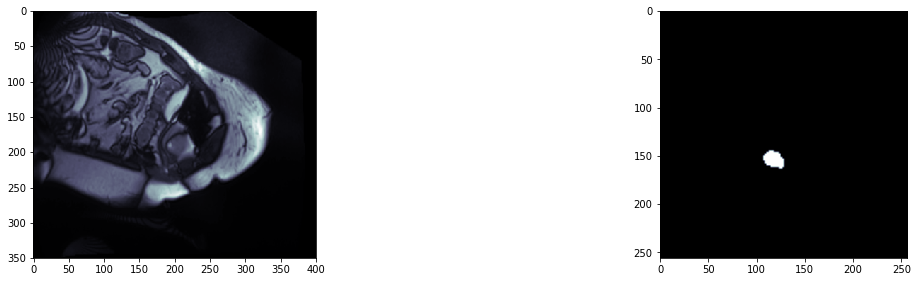

In [125]:
test_not_max3=list_not_max3[9]
print(test_not_max3)
im=np.load(test_not_max3)
print(np.max(im))
orig_im=np.load('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient034/patient034_slice10_frame16.nii.npy')

plt.figure(figsize=(20,10))
plt.subplot(221)
plt.imshow(orig_im, cmap="bone")
plt.subplot(222)
plt.imshow(im, cmap="bone")

0


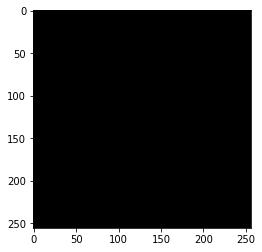

In [126]:
test_bad_label=list_bad_label[9]
im=np.load(test_bad_label)
print(np.max(im))
plt.imshow(im,cmap='bone')

In [127]:
path_good='/opt/acdc_test/opt/output/acdc/norm/1/3/patient001/patient001_slice10_frame12_label.nii.npy'
im_good=np.load(path_good)
print(np.max(im_good))
plt.imshow(im_good,cmap='bone')

FileNotFoundError: [Errno 2] No such file or directory: '/opt/acdc_test/opt/output/acdc/norm/1/3/patient001/patient001_slice10_frame12_label.nii.npy'

In [73]:
def fix_acdc(im):    
    max_val=im.max()
    if max_val!=0: 
        im[im<max_val]=0
        im[im==max_val]=1
    return im

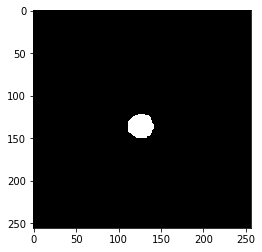

In [77]:
image2=fix_acdc(im_good)
plt.imshow(image2,cmap='bone')

In [20]:
#Comparing labels and corresponding images
list_labels=[]
for root,subdirs,files in os.walk(path):
    for file in os.listdir(root):
        filePath = os.path.join(root, file) 
        if filePath.endswith('label.nii.npy'):
            list_labels.append(file)

    

In [37]:
print (len(list_labels))

1902


In [25]:
label_name='patient003_slice2_frame01_label.nii.npy'
image_name=label_name.replace('rame0','rame')
print(image_name)
image_name1=image_name.replace('_label','')
print(image_name1)

patient003_slice2_frame1_label.nii.npy
patient003_slice2_frame1.nii.npy


In [50]:
dict_label={}
for f in list_labels:
    temp1=f.replace('rame0','rame')
    temp2=temp1.replace('_label','')
    if temp2 in list_all_images:
        dict_label[f]=1
    else:
        dict_label[f]=0
    

In [53]:
count=0
for i  in dict_label:
    if dict_label[i]==1:
        count+=1
print('Total images for labels'+str(count))        

Total images for labels1902


In [128]:
def get_file_info(file):
    filename = os.path.basename(file)
    filedir = os.path.dirname(file)
    nodes = filename.split('_')
    patient = nodes[0]
    islice = nodes[1]
    frame = int(nodes[2].replace('frame',''))
    return filename, filedir, patient, islice, frame

In [129]:
def get_the_other(firstfile, myslice, filepath):
    origimage = None
    lblimage = None
    
    for j in glob.glob(filepath+'/*label*'):
        if firstfile == j:
            continue

        filename, filedir, patient, islice, frame = get_file_info(j)
        
        if myslice != islice:
            continue
            
        origimage = fix_orig_name(j)
        lblimage = j
        
    return origimage, lblimage

In [130]:
def fix_orig_name(origimage):
    origimage = origimage.replace('_label','')
    return origimage.replace('frame0','frame')

In [229]:
plotall = {}
columns=['PatientID','Image Path','Label Path','Reason','Slice#','Frame#','ED/ES']
temp_list=[]

for i in list_not_max3 + list_bad_label:
    filename, filedir, patient, islice, frame = get_file_info(i)    
    #print ('fr',frame, filedir)
    EDY='ES'
    if i in list_bad_label:
        im_type='All zeros'
    else:
        im_type='Not max3'
       
    if frame < 5:
        origdia = fix_orig_name(i)
        lbldia = i
        EDY='ED'
        origsys, lblsys = get_the_other(i, islice, filedir)
        plotall.update({tuple([origdia, lbldia, origsys, lblsys,im_type]):1})
        #print ('pa', plotall)
        temp_list.append([patient,origdia,i,im_type,islice,frame,EDY])
        continue
        
    origsys = fix_orig_name(i)
    lblsys = i
    origdia, lbldia = get_the_other(i, islice, filedir)
    plotall.update({tuple([origsys, lblsys, origdia, lbldia,im_type]):1})
    #break
    temp_list.append([patient,origsys,i,im_type,islice,frame,EDY])
res_df=pd.DataFrame(temp_list,columns=columns)
#get the slice # of the frame from either of the two lists
#Patient# image_path  bad_label_path 'all zeros/not max 3'  'if slice==1 base  else apex'  'if frame is <5 D else S'   

In [233]:
res_df.groupby('ED/ES').size()

ED/ES
ED    17
ES    77
dtype: int64

In [242]:
res_df[(res_df['Slice#']=='slice1')].count()

PatientID     31
Image Path    31
Label Path    31
Reason        31
Slice#        31
Frame#        31
ED/ES         31
dtype: int64

In [237]:
#res_df[('Slice#'=='slice1')].groupby('Slice#').size()
res_df[(res_df['Slice#']=='slice1')].groupby('ED/ES').size()

ED/ES
ED     5
ES    26
dtype: int64

In [243]:
res_df[(res_df['Slice#']!='slice1')].groupby('ED/ES').size()

ED/ES
ED    12
ES    51
dtype: int64

In [195]:
len(list_not_max3), len(list_bad_label)

(33, 61)

In [196]:
ps = {}
pslist = []
for i in sorted(list_not_max3):
    filename, filedir, patient, islice, frame = get_file_info(i)
    pslist.append([patient, islice])
    ps.update({(patient, islice): 1})

In [197]:
for i in sorted(list_bad_label):
    filename, filedir, patient, islice, frame = get_file_info(i)
    pslist.append([patient, islice])
    ps.update({(patient, islice): 1})

In [198]:
len(pslist)

94

In [200]:
len(ps)

77

In [201]:
len(plotall)

80

In [202]:
plotall = sorted(list(set(plotall)))

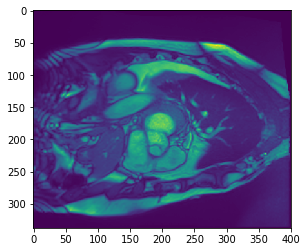

In [203]:
plt.imshow(np.load(plotall[0][0]))

In [190]:
#original_systole_image=
#systole_label='/masvol/output/dsb/norm/1/3/unet_model_validate/combined_1_3_0_176_aug_bce_predict/dsb_508_176_predictions.npy'
#diastole_label='/masvol/output/dsb/norm/1/3/unet_model_validate/combined_1_3_0_176_aug_bce_predict/dsb_508_176_ts_norm.npy'
#original_diastole_image

In [191]:
#!ls /masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient099/patient099_slice16_frame09.nii.

In [204]:
import pprint
#pp = pprint.PrettyPrinter(indent=4)

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient001/patient001_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient001/patient001_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient001/patient001_slice1_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient001/patient001_slice1_frame12_label.nii.npy',
 'All zeros')
'All zeros'


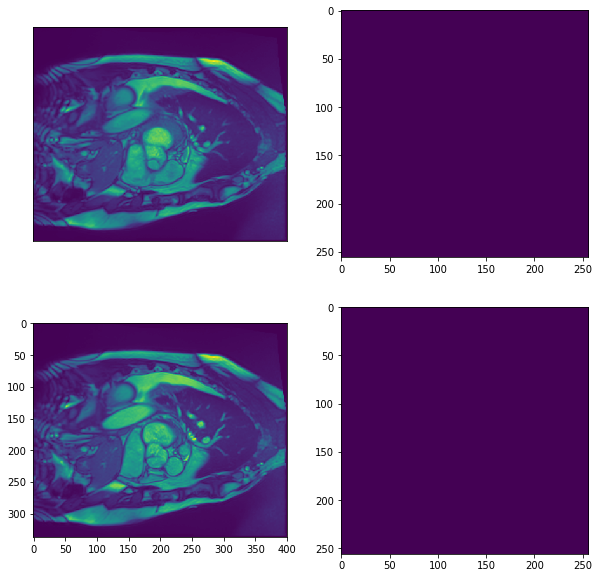

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient006/patient006_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient006/patient006_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient006/patient006_slice1_frame16.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient006/patient006_slice1_frame16_label.nii.npy',
 'All zeros')
'All zeros'


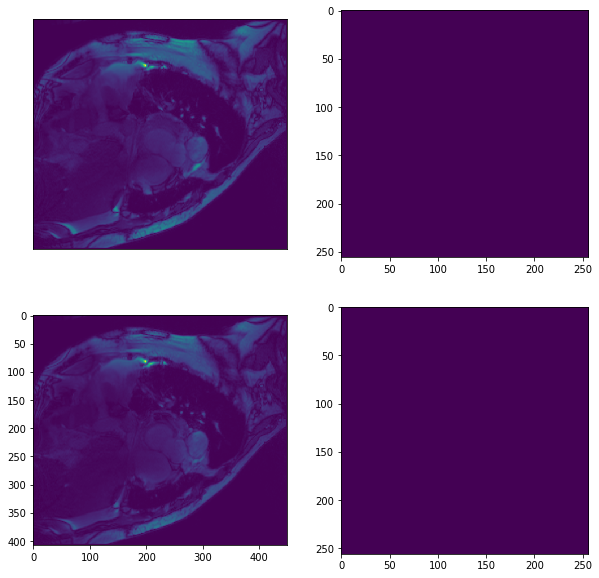

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient012/patient012_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient012/patient012_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient012/patient012_slice1_frame13.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient012/patient012_slice1_frame13_label.nii.npy',
 'All zeros')
'All zeros'


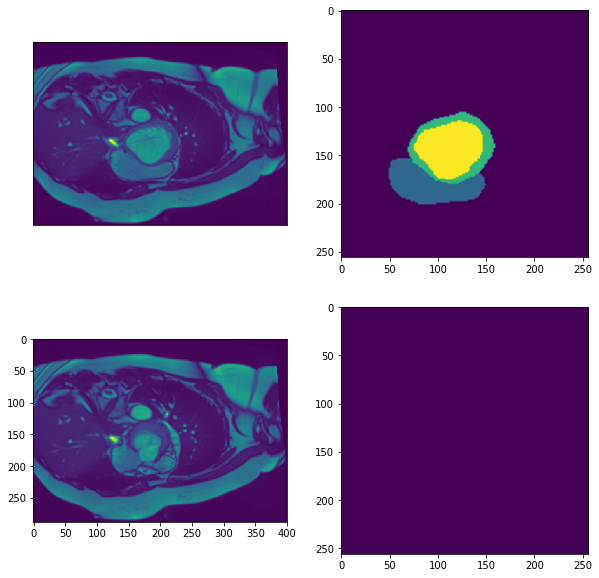

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient015/patient015_slice9_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient015/patient015_slice9_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient015/patient015_slice9_frame10.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient015/patient015_slice9_frame10_label.nii.npy',
 'Not max3')
'Not max3'


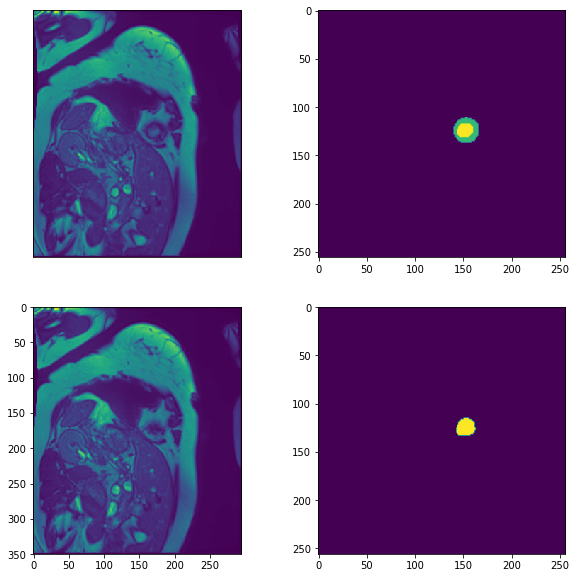

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient019/patient019_slice11_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient019/patient019_slice11_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient019/patient019_slice11_frame11.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient019/patient019_slice11_frame11_label.nii.npy',
 'Not max3')
'Not max3'


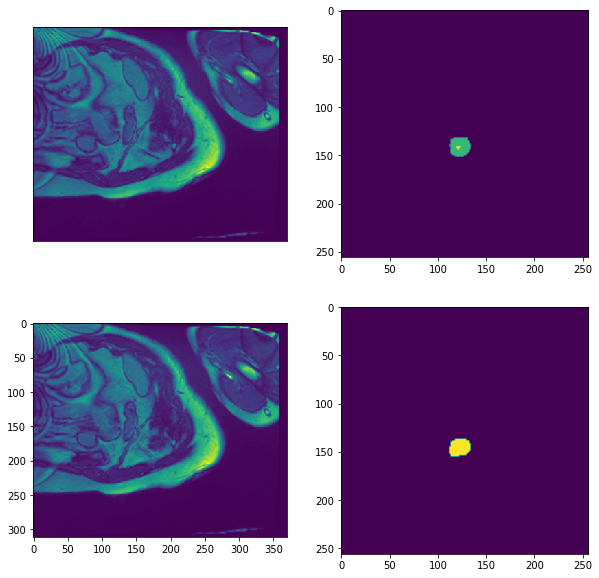

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient021/patient021_slice10_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient021/patient021_slice10_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient021/patient021_slice10_frame13.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient021/patient021_slice10_frame13_label.nii.npy',
 'Not max3')
'Not max3'


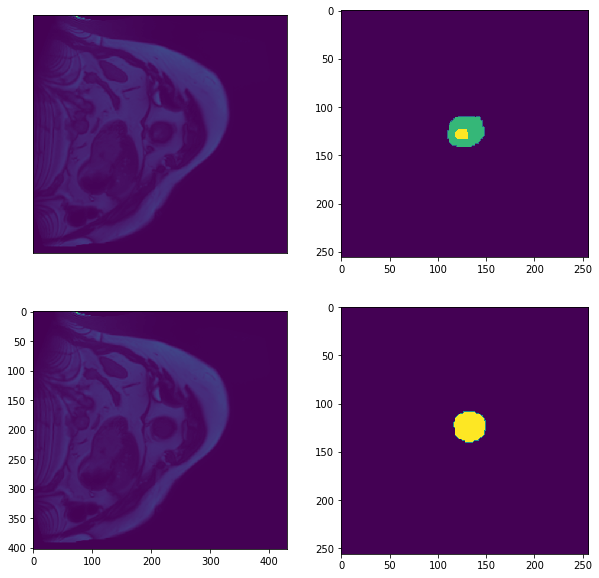

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient021/patient021_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient021/patient021_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient021/patient021_slice1_frame13.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient021/patient021_slice1_frame13_label.nii.npy',
 'All zeros')
'All zeros'


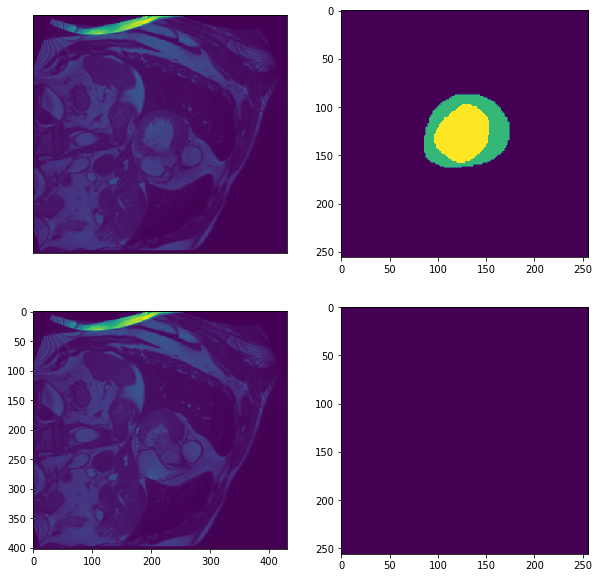

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient023/patient023_slice8_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient023/patient023_slice8_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient023/patient023_slice8_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient023/patient023_slice8_frame09_label.nii.npy',
 'Not max3')
'Not max3'


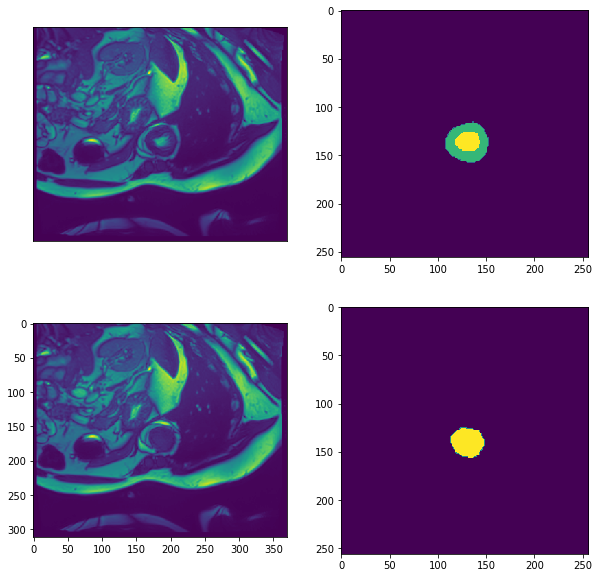

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient023/patient023_slice9_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient023/patient023_slice9_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient023/patient023_slice9_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient023/patient023_slice9_frame09_label.nii.npy',
 'All zeros')
'All zeros'


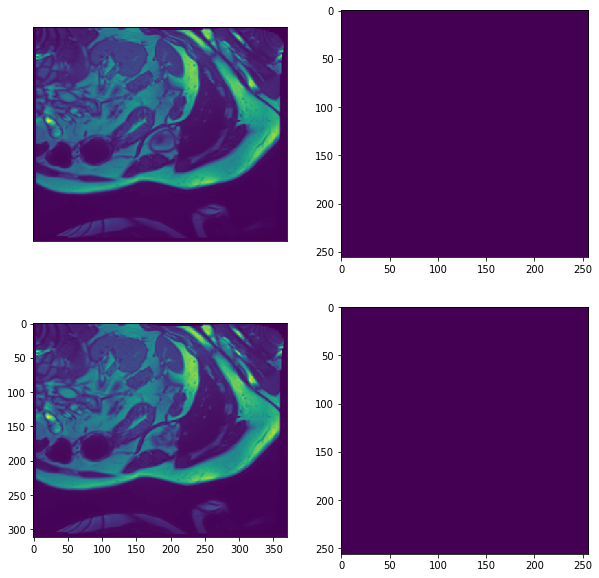

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient024/patient024_slice8_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient024/patient024_slice8_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient024/patient024_slice8_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient024/patient024_slice8_frame09_label.nii.npy',
 'Not max3')
'Not max3'


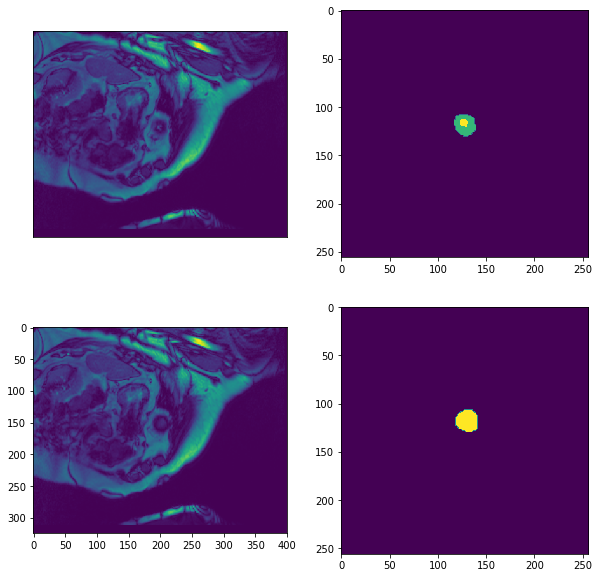

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient026/patient026_slice10_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient026/patient026_slice10_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient026/patient026_slice10_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient026/patient026_slice10_frame12_label.nii.npy',
 'Not max3')
'Not max3'


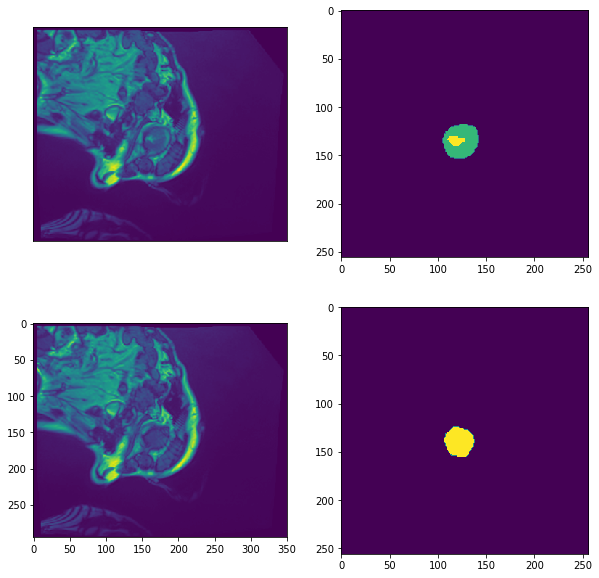

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient026/patient026_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient026/patient026_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient026/patient026_slice1_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient026/patient026_slice1_frame12_label.nii.npy',
 'All zeros')
'All zeros'


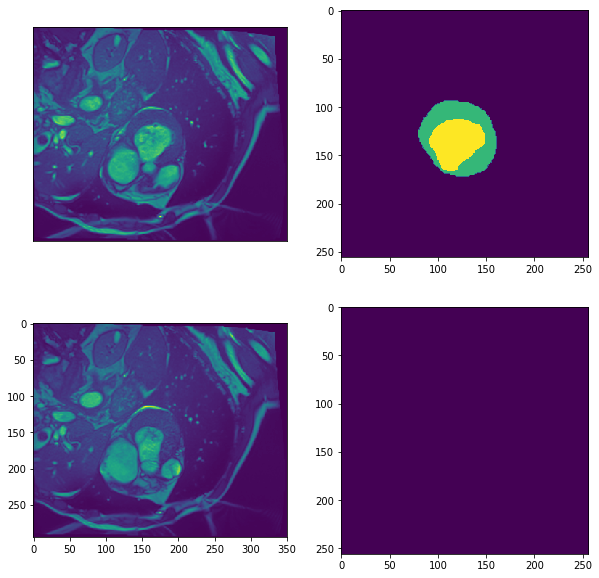

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient027/patient027_slice10_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient027/patient027_slice10_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient027/patient027_slice10_frame11.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient027/patient027_slice10_frame11_label.nii.npy',
 'Not max3')
'Not max3'


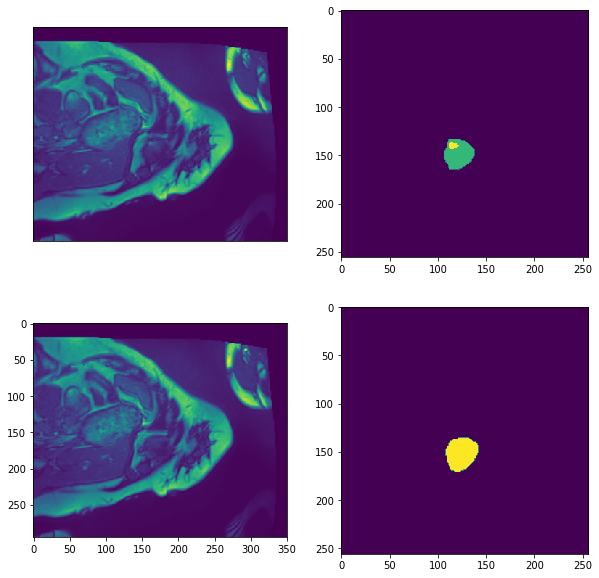

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient027/patient027_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient027/patient027_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient027/patient027_slice1_frame11.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient027/patient027_slice1_frame11_label.nii.npy',
 'All zeros')
'All zeros'


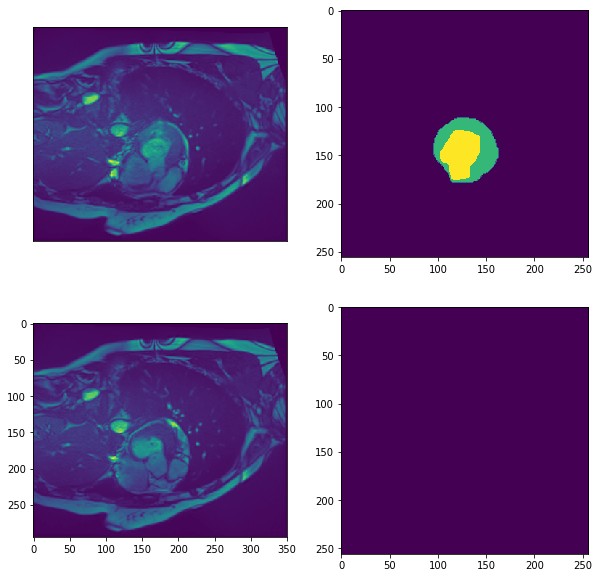

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient028/patient028_slice10_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient028/patient028_slice10_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient028/patient028_slice10_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient028/patient028_slice10_frame09_label.nii.npy',
 'All zeros')
'All zeros'


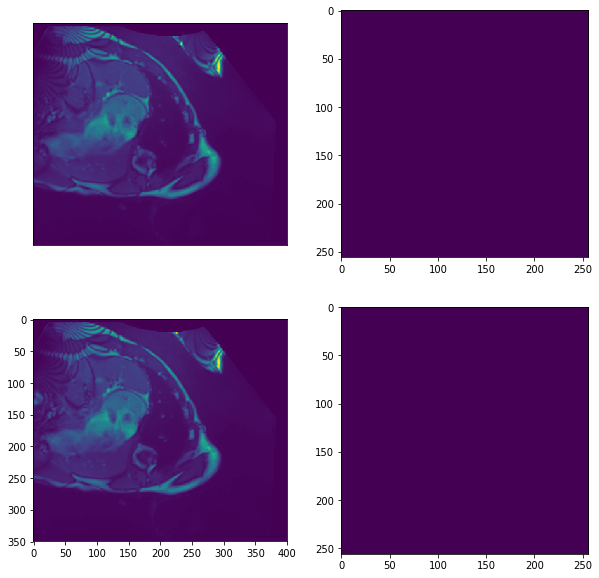

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient028/patient028_slice8_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient028/patient028_slice8_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient028/patient028_slice8_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient028/patient028_slice8_frame09_label.nii.npy',
 'Not max3')
'Not max3'


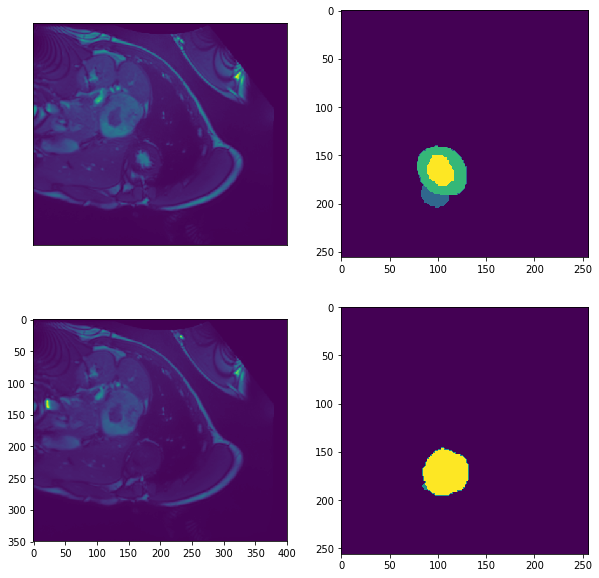

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient028/patient028_slice9_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient028/patient028_slice9_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient028/patient028_slice9_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient028/patient028_slice9_frame09_label.nii.npy',
 'Not max3')
'Not max3'


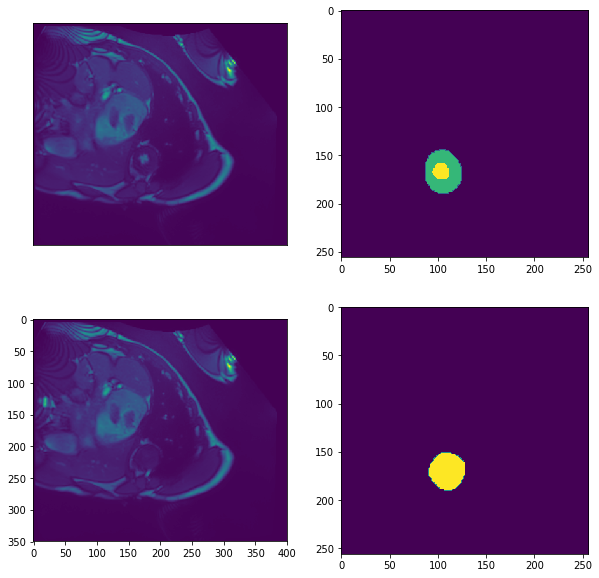

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient029/patient029_slice11_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient029/patient029_slice11_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient029/patient029_slice11_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient029/patient029_slice11_frame12_label.nii.npy',
 'All zeros')
'All zeros'


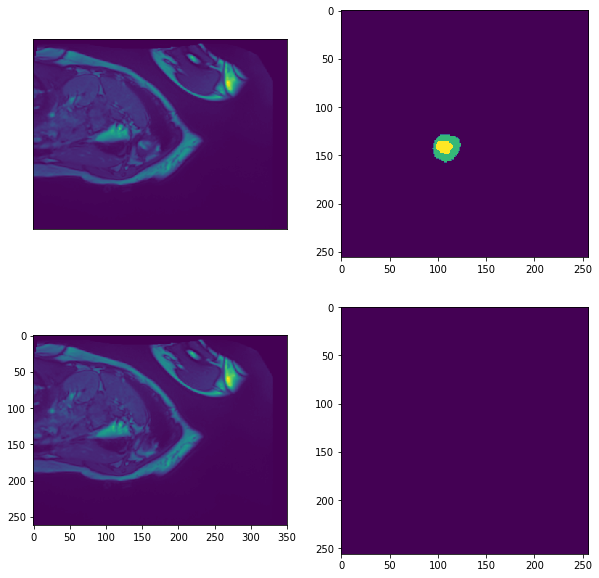

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient029/patient029_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient029/patient029_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient029/patient029_slice1_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient029/patient029_slice1_frame12_label.nii.npy',
 'All zeros')
'All zeros'


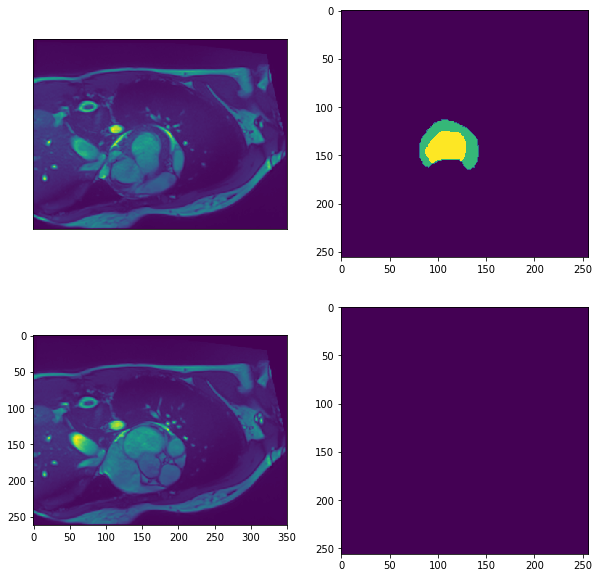

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient029/patient029_slice2_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient029/patient029_slice2_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient029/patient029_slice2_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient029/patient029_slice2_frame12_label.nii.npy',
 'All zeros')
'All zeros'


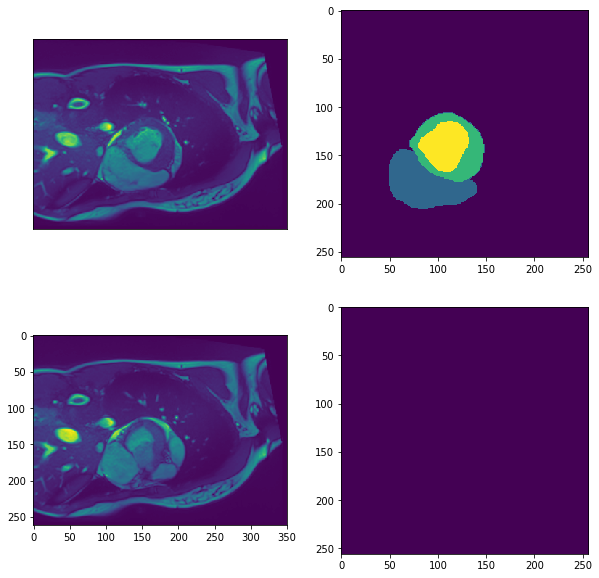

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient030/patient030_slice10_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient030/patient030_slice10_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient030/patient030_slice10_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient030/patient030_slice10_frame12_label.nii.npy',
 'All zeros')
'All zeros'


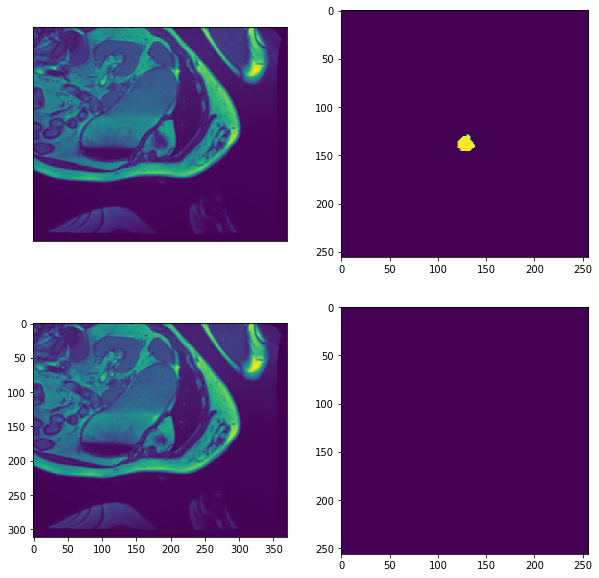

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient030/patient030_slice10_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient030/patient030_slice10_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient030/patient030_slice10_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient030/patient030_slice10_frame12_label.nii.npy',
 'Not max3')
'Not max3'


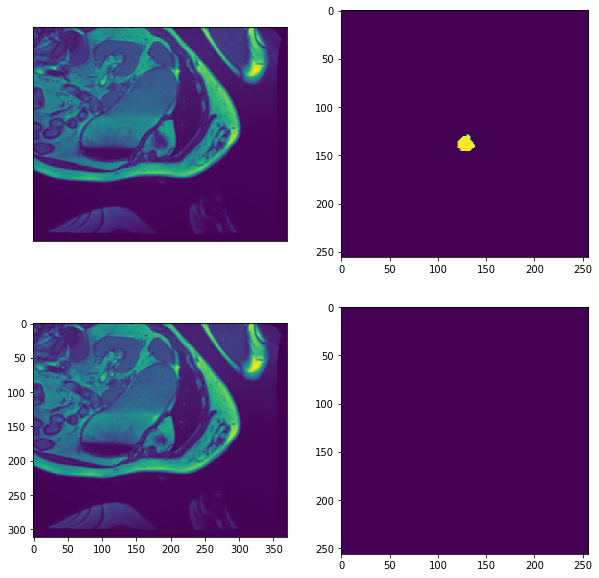

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient030/patient030_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient030/patient030_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient030/patient030_slice1_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient030/patient030_slice1_frame12_label.nii.npy',
 'All zeros')
'All zeros'


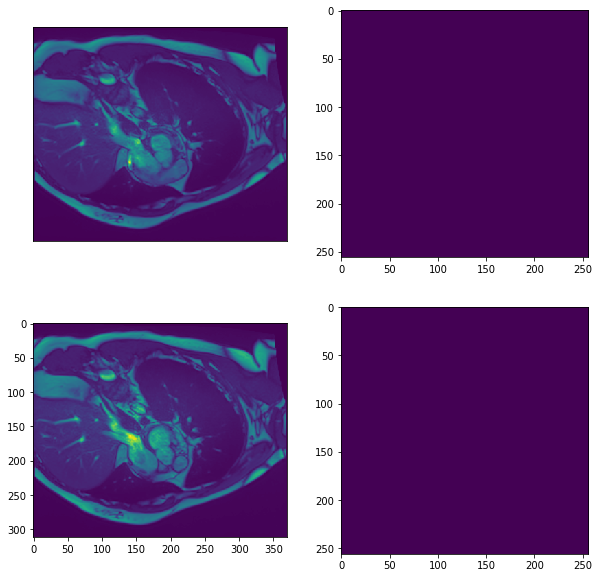

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient031/patient031_slice10_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient031/patient031_slice10_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient031/patient031_slice10_frame10.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient031/patient031_slice10_frame10_label.nii.npy',
 'All zeros')
'All zeros'


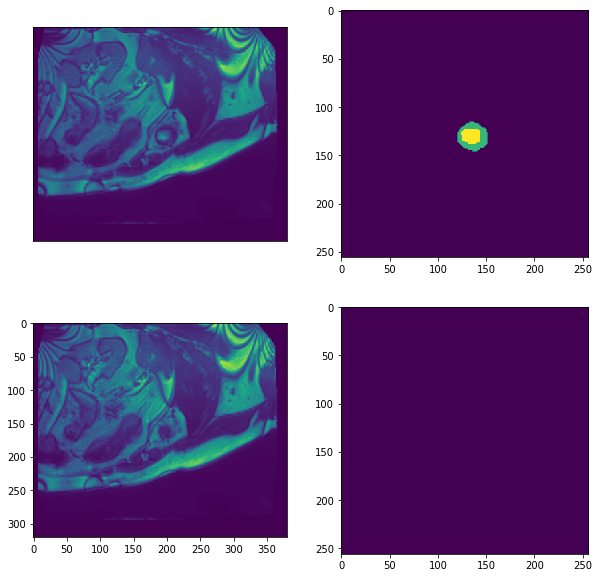

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient031/patient031_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient031/patient031_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient031/patient031_slice1_frame10.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient031/patient031_slice1_frame10_label.nii.npy',
 'All zeros')
'All zeros'


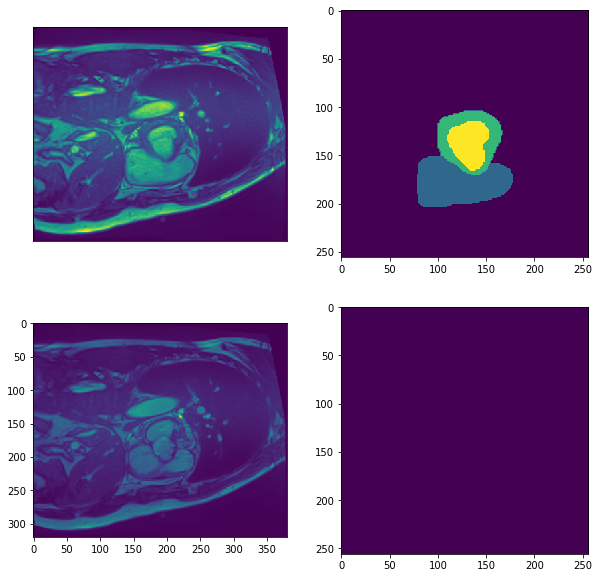

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient031/patient031_slice9_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient031/patient031_slice9_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient031/patient031_slice9_frame10.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient031/patient031_slice9_frame10_label.nii.npy',
 'Not max3')
'Not max3'


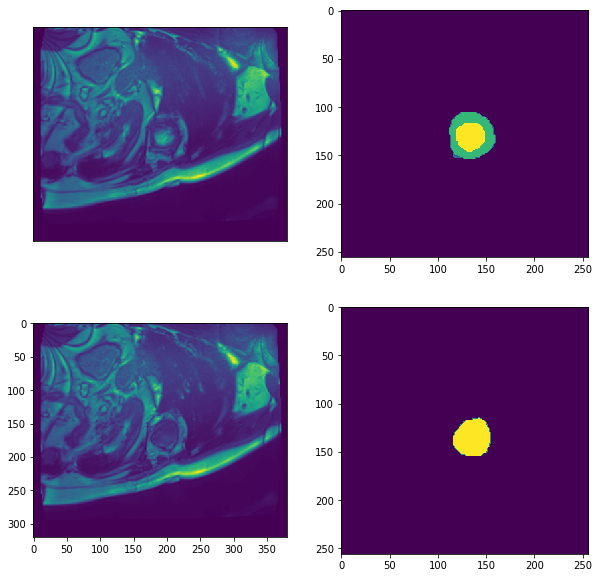

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient032/patient032_slice10_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient032/patient032_slice10_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient032/patient032_slice10_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient032/patient032_slice10_frame12_label.nii.npy',
 'Not max3')
'Not max3'


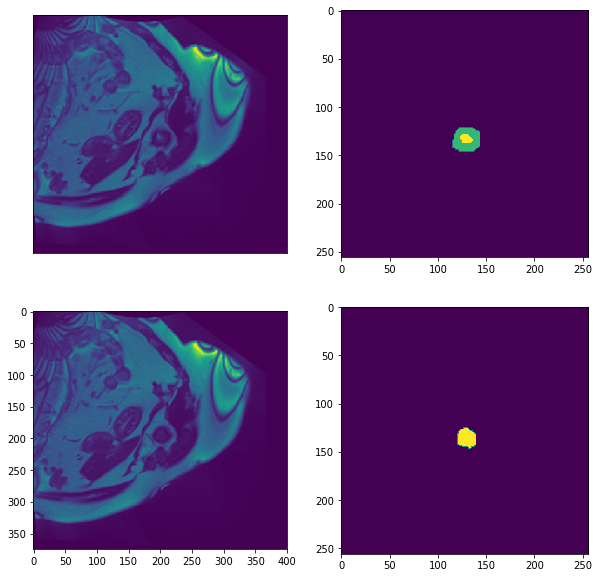

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient032/patient032_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient032/patient032_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient032/patient032_slice1_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient032/patient032_slice1_frame12_label.nii.npy',
 'All zeros')
'All zeros'


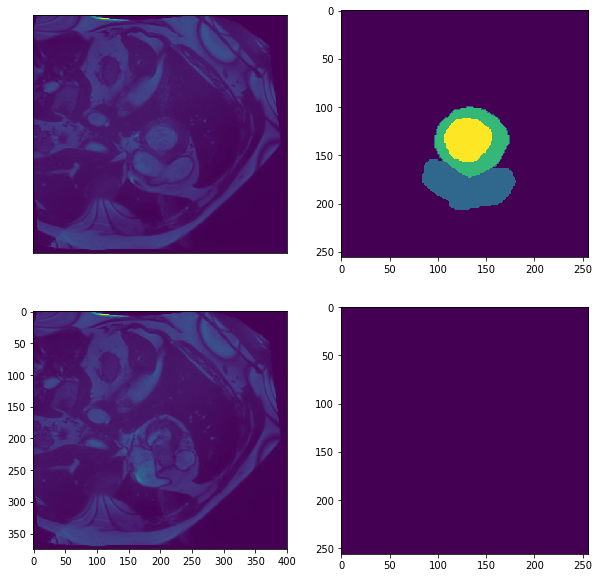

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient032/patient032_slice9_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient032/patient032_slice9_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient032/patient032_slice9_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient032/patient032_slice9_frame12_label.nii.npy',
 'Not max3')
'Not max3'


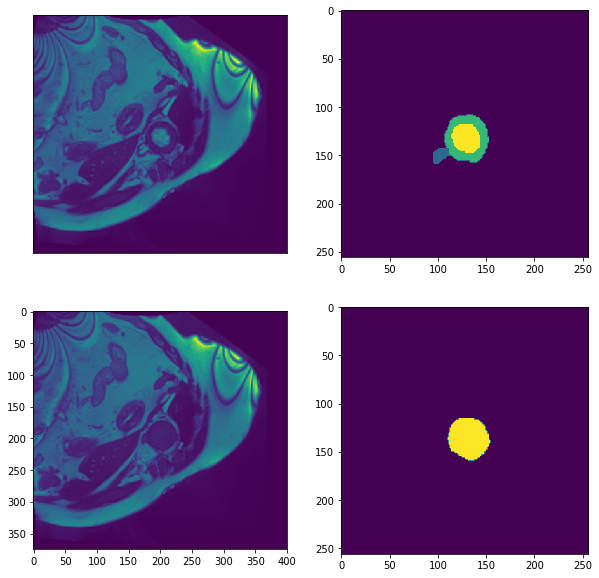

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient033/patient033_slice10_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient033/patient033_slice10_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient033/patient033_slice10_frame14.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient033/patient033_slice10_frame14_label.nii.npy',
 'All zeros')
'All zeros'


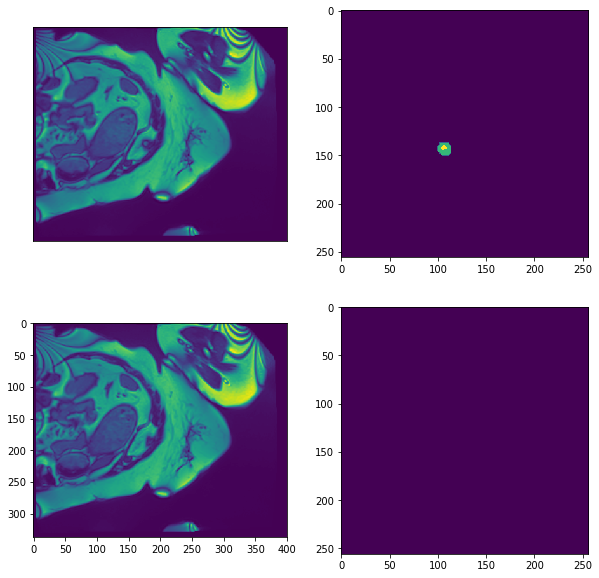

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient033/patient033_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient033/patient033_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient033/patient033_slice1_frame14.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient033/patient033_slice1_frame14_label.nii.npy',
 'All zeros')
'All zeros'


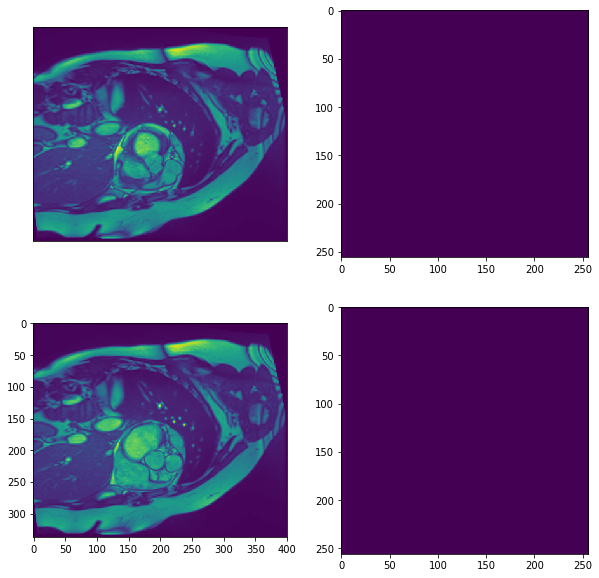

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient033/patient033_slice2_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient033/patient033_slice2_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient033/patient033_slice2_frame14.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient033/patient033_slice2_frame14_label.nii.npy',
 'All zeros')
'All zeros'


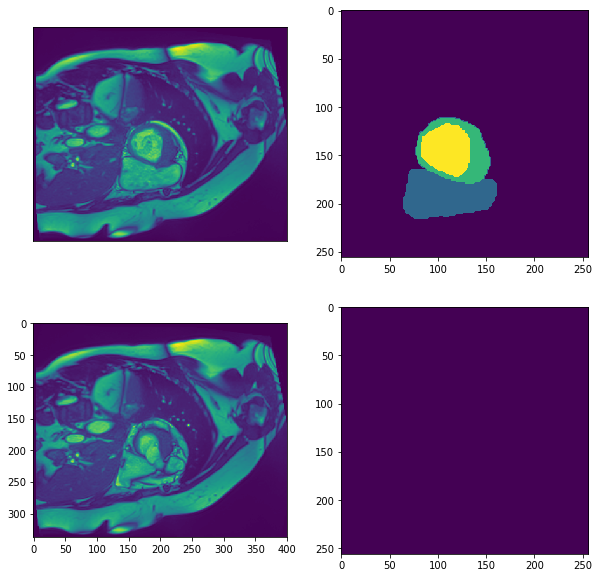

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient034/patient034_slice10_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient034/patient034_slice10_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient034/patient034_slice10_frame16.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient034/patient034_slice10_frame16_label.nii.npy',
 'Not max3')
'Not max3'


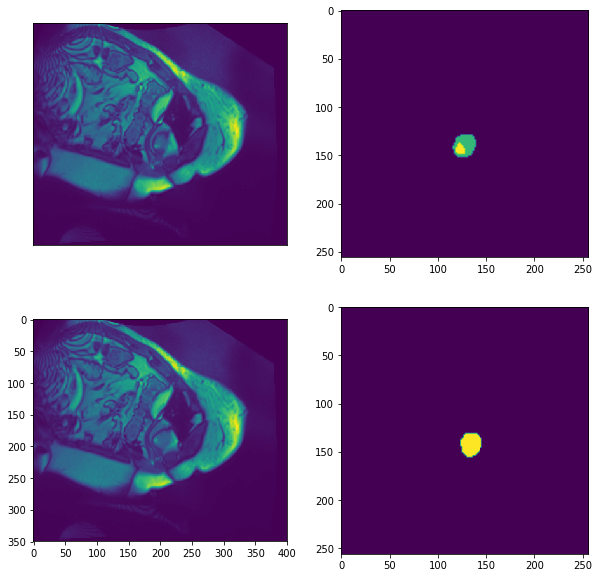

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient035/patient035_slice13_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient035/patient035_slice13_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient035/patient035_slice13_frame11.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient035/patient035_slice13_frame11_label.nii.npy',
 'Not max3')
'Not max3'


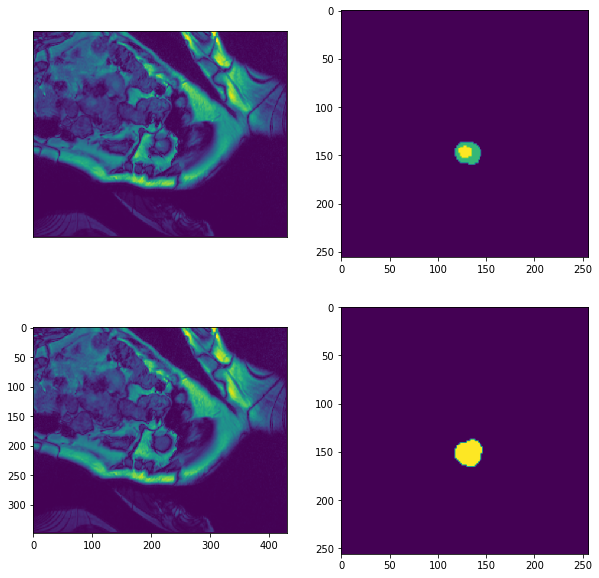

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient037/patient037_slice7_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient037/patient037_slice7_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient037/patient037_slice7_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient037/patient037_slice7_frame12_label.nii.npy',
 'Not max3')
'Not max3'


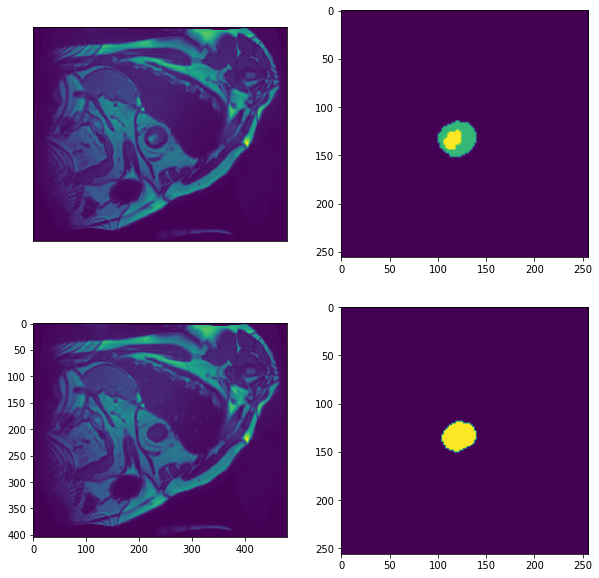

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient039/patient039_slice9_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient039/patient039_slice9_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient039/patient039_slice9_frame10.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient039/patient039_slice9_frame10_label.nii.npy',
 'Not max3')
'Not max3'


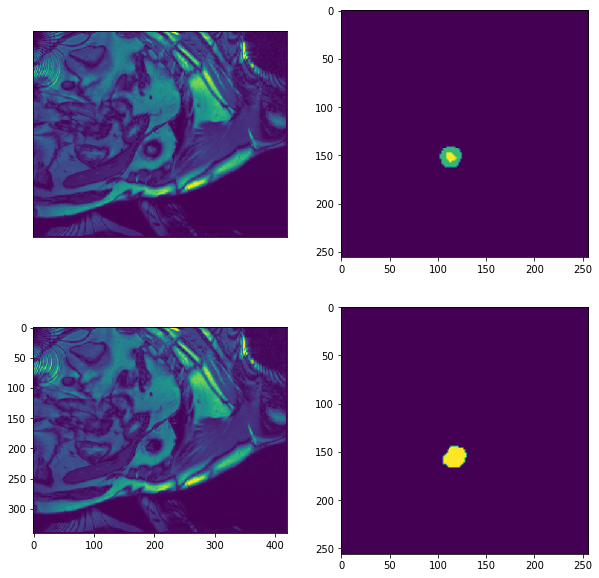

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient047/patient047_slice9_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient047/patient047_slice9_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient047/patient047_slice9_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient047/patient047_slice9_frame09_label.nii.npy',
 'All zeros')
'All zeros'


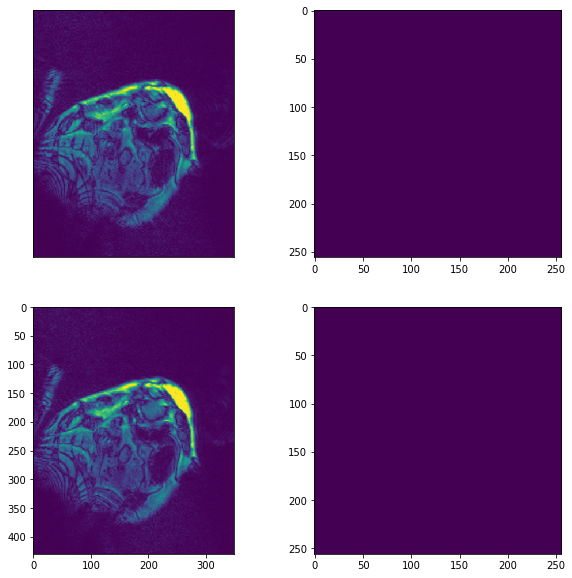

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient049/patient049_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient049/patient049_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient049/patient049_slice1_frame11.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient049/patient049_slice1_frame11_label.nii.npy',
 'All zeros')
'All zeros'


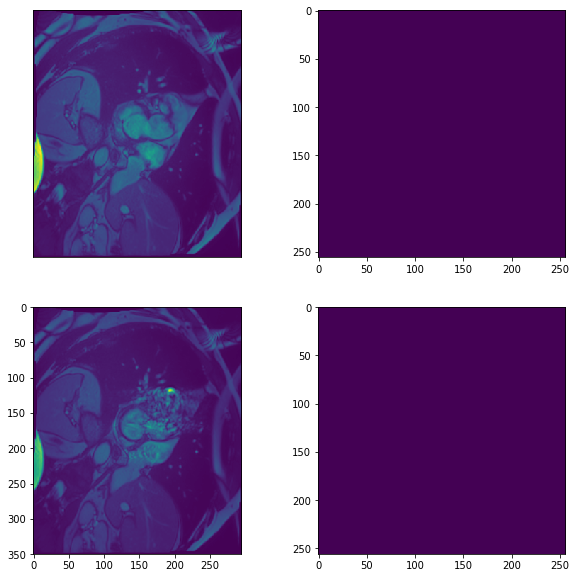

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient051/patient051_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient051/patient051_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient051/patient051_slice1_frame11.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient051/patient051_slice1_frame11_label.nii.npy',
 'All zeros')
'All zeros'


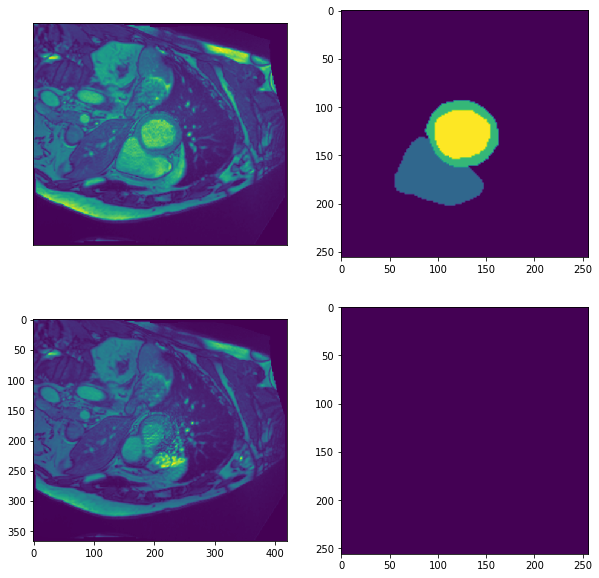

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient054/patient054_slice8_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient054/patient054_slice8_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient054/patient054_slice8_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient054/patient054_slice8_frame12_label.nii.npy',
 'All zeros')
'All zeros'


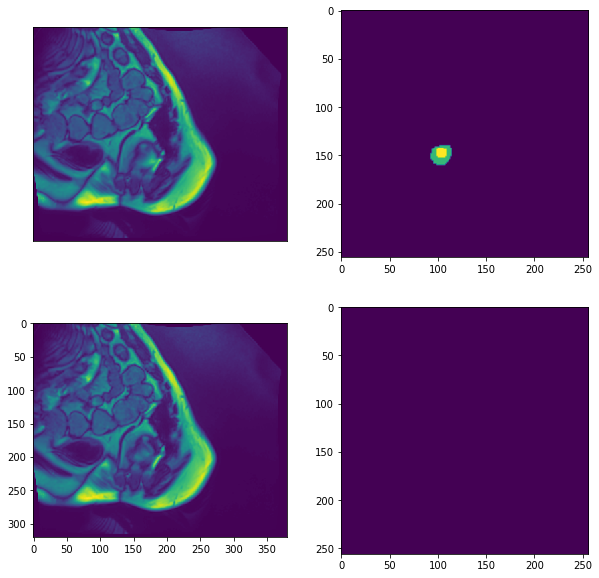

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient056/patient056_slice9_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient056/patient056_slice9_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient056/patient056_slice9_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient056/patient056_slice9_frame12_label.nii.npy',
 'All zeros')
'All zeros'


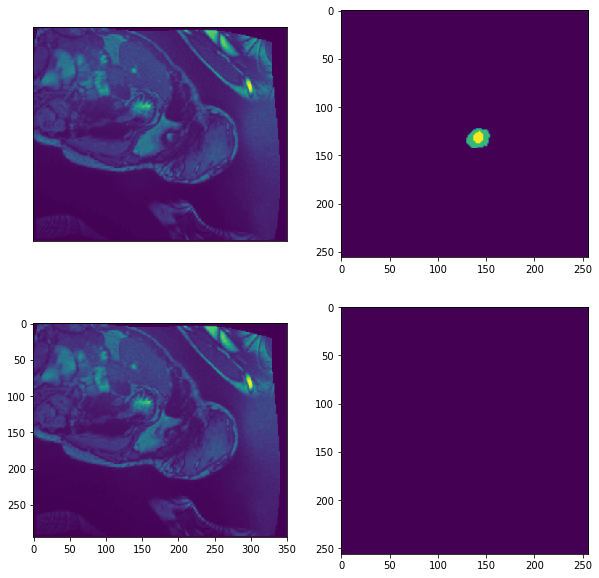

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient057/patient057_slice8_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient057/patient057_slice8_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient057/patient057_slice8_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient057/patient057_slice8_frame09_label.nii.npy',
 'Not max3')
'Not max3'


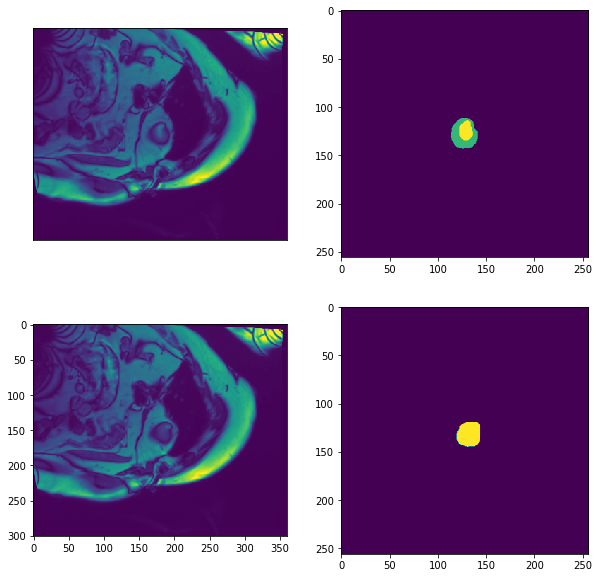

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient060/patient060_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient060/patient060_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient060/patient060_slice1_frame14.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient060/patient060_slice1_frame14_label.nii.npy',
 'All zeros')
'All zeros'


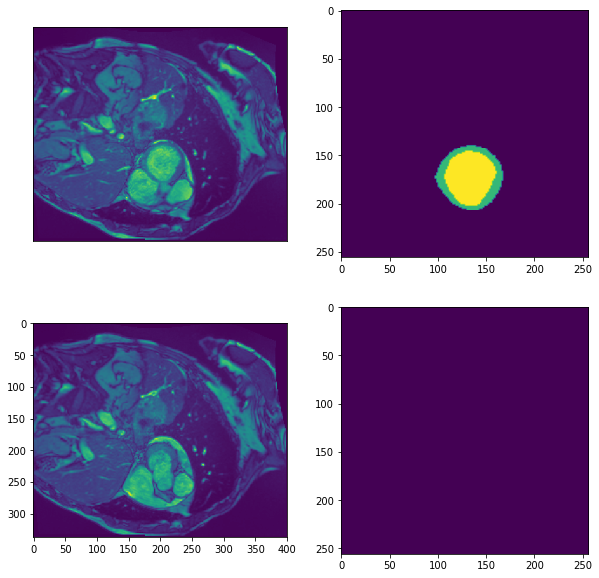

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient061/patient061_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient061/patient061_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient061/patient061_slice1_frame10.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient061/patient061_slice1_frame10_label.nii.npy',
 'All zeros')
'All zeros'


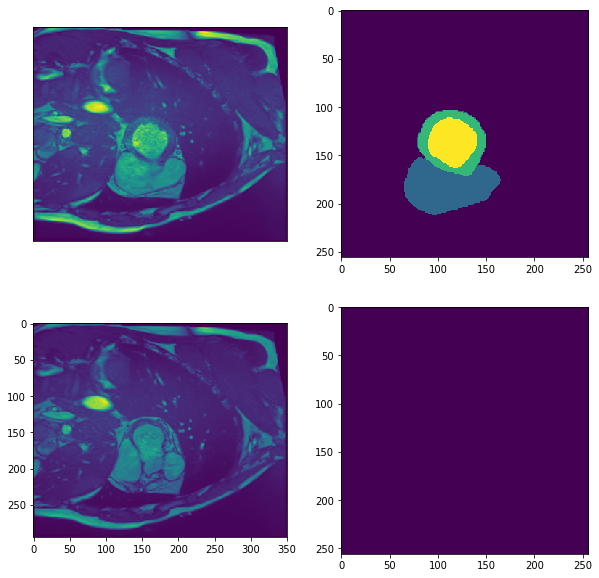

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient061/patient061_slice9_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient061/patient061_slice9_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient061/patient061_slice9_frame10.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient061/patient061_slice9_frame10_label.nii.npy',
 'All zeros')
'All zeros'


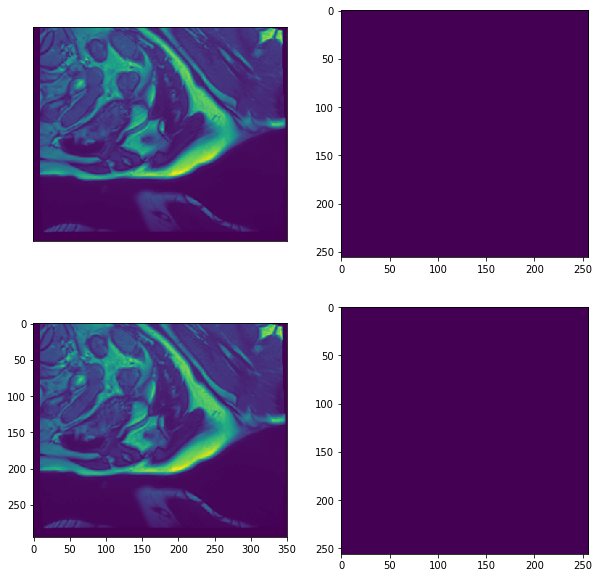

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient062/patient062_slice10_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient062/patient062_slice10_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient062/patient062_slice10_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient062/patient062_slice10_frame09_label.nii.npy',
 'All zeros')
'All zeros'


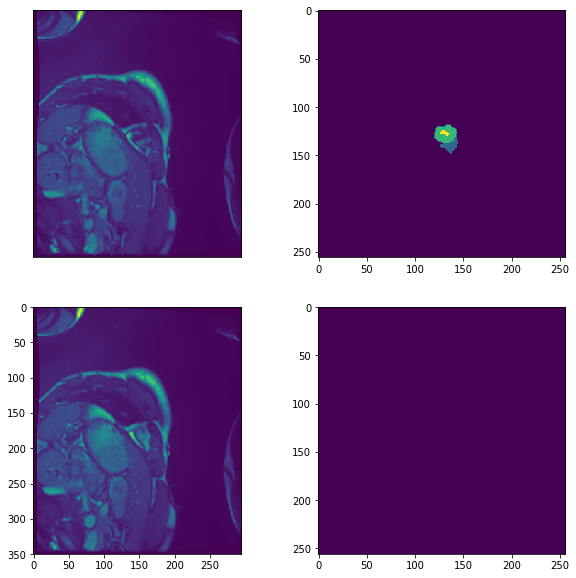

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient063/patient063_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient063/patient063_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient063/patient063_slice1_frame16.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient063/patient063_slice1_frame16_label.nii.npy',
 'All zeros')
'All zeros'


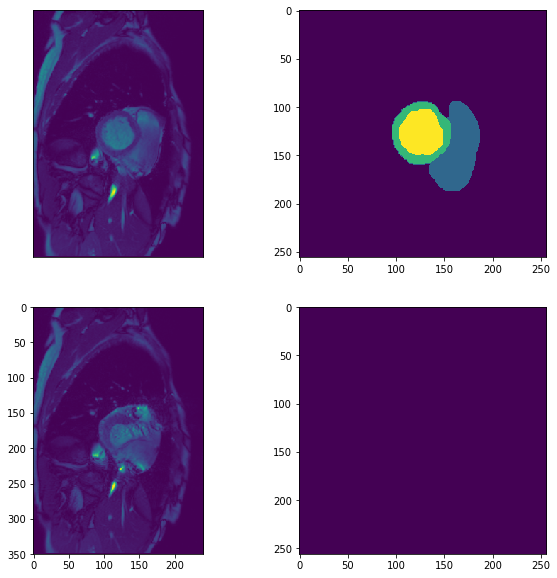

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient063/patient063_slice8_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient063/patient063_slice8_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient063/patient063_slice8_frame16.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient063/patient063_slice8_frame16_label.nii.npy',
 'All zeros')
'All zeros'


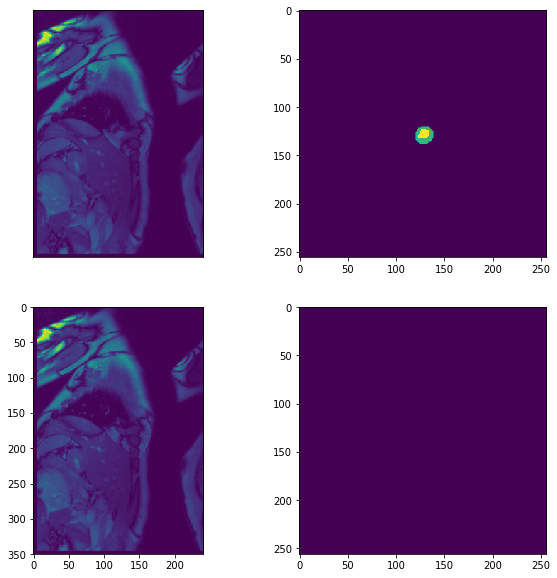

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient064/patient064_slice10_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient064/patient064_slice10_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient064/patient064_slice10_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient064/patient064_slice10_frame12_label.nii.npy',
 'All zeros')
'All zeros'


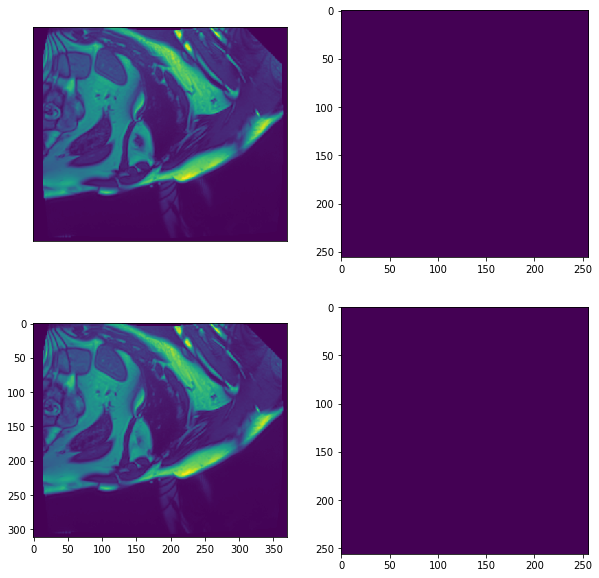

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient065/patient065_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient065/patient065_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient065/patient065_slice1_frame14.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient065/patient065_slice1_frame14_label.nii.npy',
 'All zeros')
'All zeros'


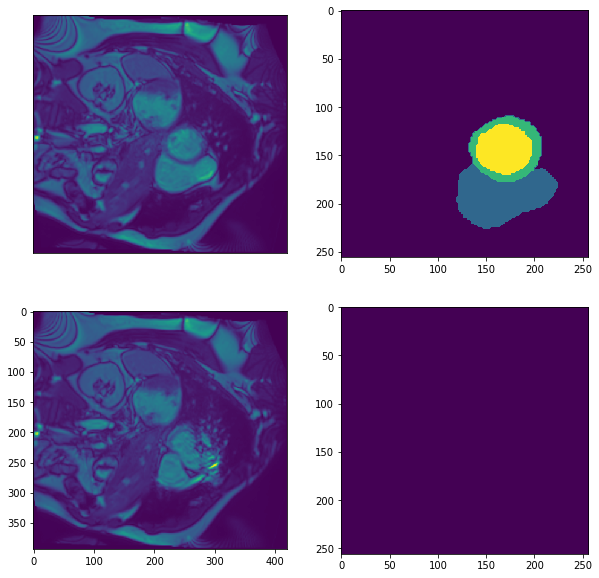

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient066/patient066_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient066/patient066_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient066/patient066_slice1_frame11.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient066/patient066_slice1_frame11_label.nii.npy',
 'All zeros')
'All zeros'


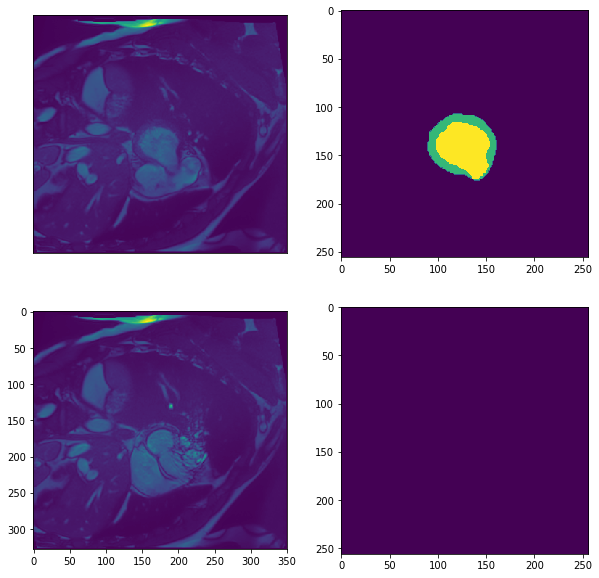

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient067/patient067_slice10_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient067/patient067_slice10_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient067/patient067_slice10_frame10.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient067/patient067_slice10_frame10_label.nii.npy',
 'All zeros')
'All zeros'


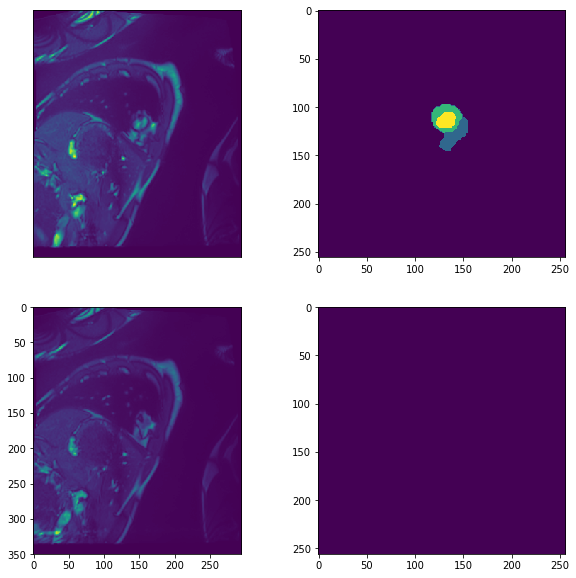

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient071/patient071_slice10_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient071/patient071_slice10_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient071/patient071_slice10_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient071/patient071_slice10_frame09_label.nii.npy',
 'All zeros')
'All zeros'


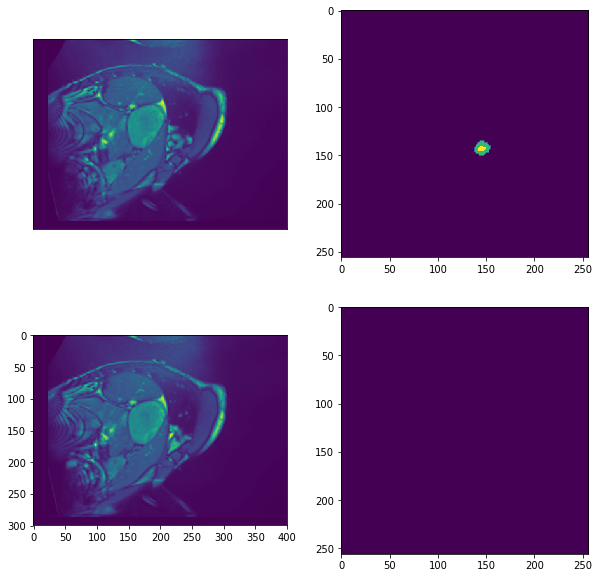

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient071/patient071_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient071/patient071_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient071/patient071_slice1_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient071/patient071_slice1_frame09_label.nii.npy',
 'All zeros')
'All zeros'


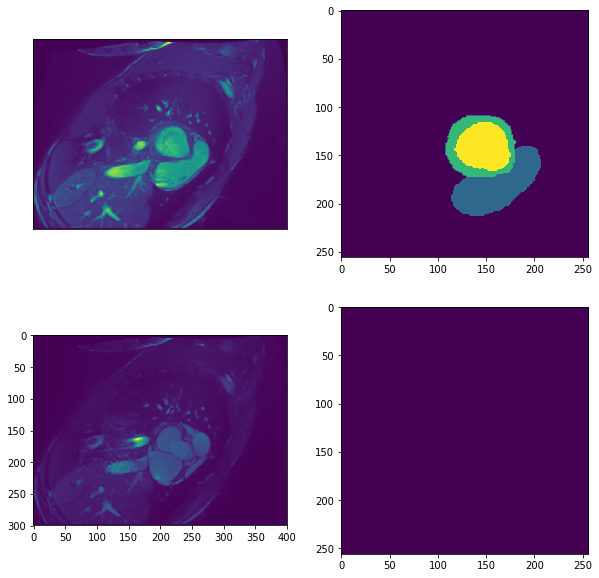

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient072/patient072_slice8_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient072/patient072_slice8_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient072/patient072_slice8_frame11.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient072/patient072_slice8_frame11_label.nii.npy',
 'All zeros')
'All zeros'


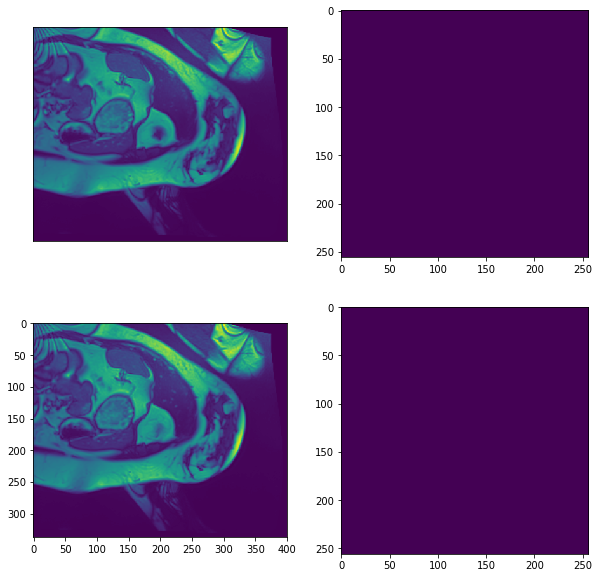

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient076/patient076_slice8_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient076/patient076_slice8_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient076/patient076_slice8_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient076/patient076_slice8_frame12_label.nii.npy',
 'Not max3')
'Not max3'


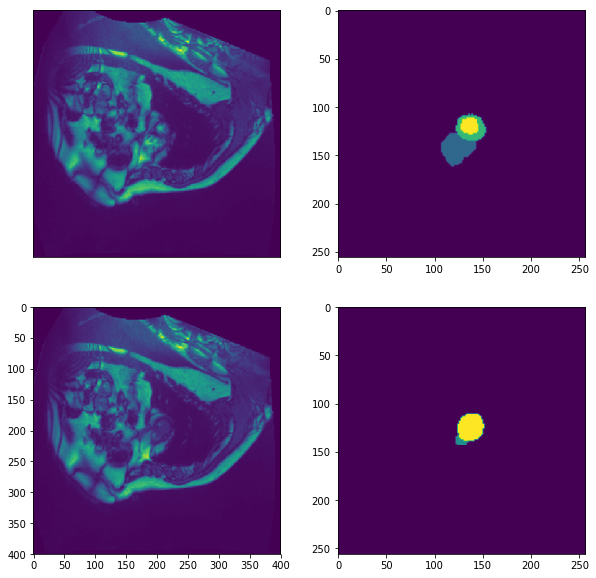

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient077/patient077_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient077/patient077_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient077/patient077_slice1_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient077/patient077_slice1_frame09_label.nii.npy',
 'All zeros')
'All zeros'


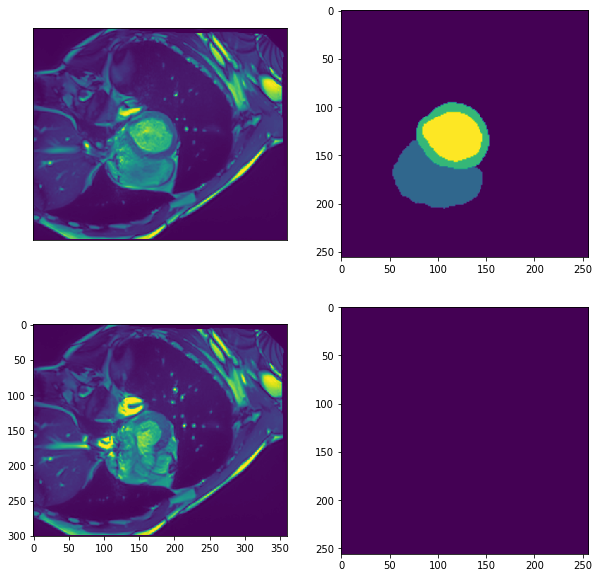

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient077/patient077_slice8_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient077/patient077_slice8_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient077/patient077_slice8_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient077/patient077_slice8_frame09_label.nii.npy',
 'All zeros')
'All zeros'


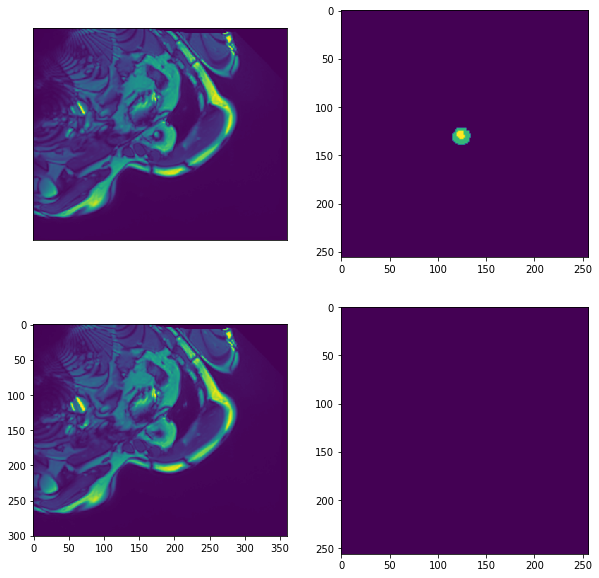

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient079/patient079_slice9_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient079/patient079_slice9_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient079/patient079_slice9_frame11.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient079/patient079_slice9_frame11_label.nii.npy',
 'Not max3')
'Not max3'


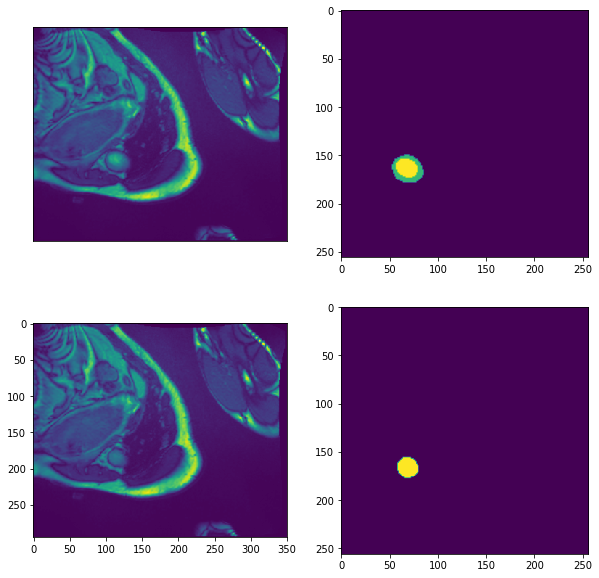

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient081/patient081_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient081/patient081_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient081/patient081_slice1_frame7.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient081/patient081_slice1_frame07_label.nii.npy',
 'All zeros')
'All zeros'


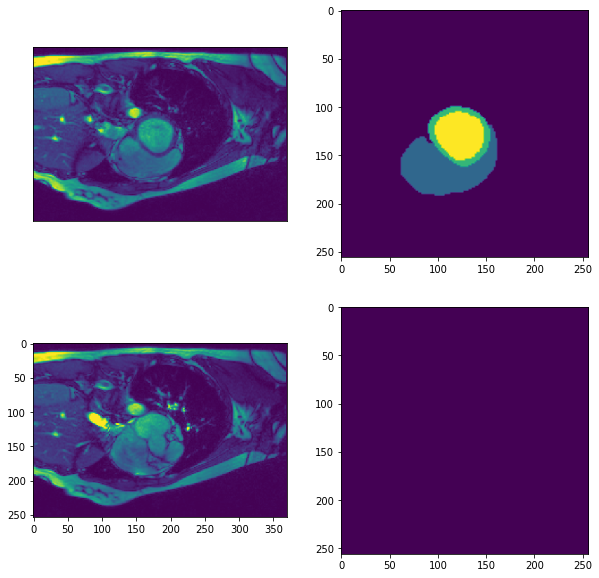

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient081/patient081_slice2_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient081/patient081_slice2_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient081/patient081_slice2_frame7.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient081/patient081_slice2_frame07_label.nii.npy',
 'All zeros')
'All zeros'


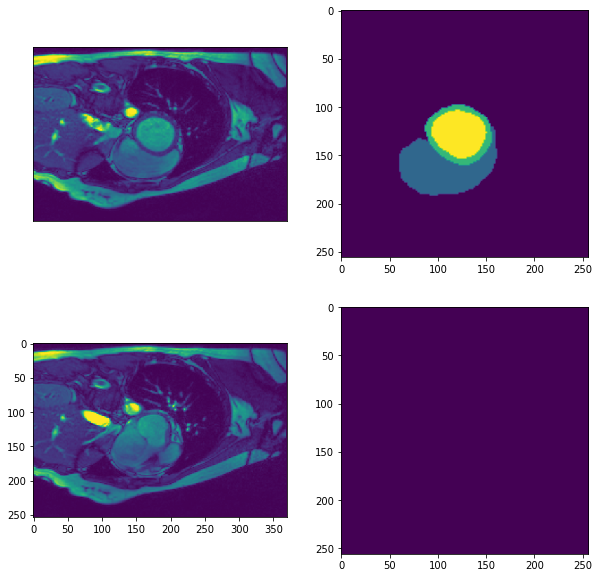

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient084/patient084_slice12_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient084/patient084_slice12_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient084/patient084_slice12_frame10.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient084/patient084_slice12_frame10_label.nii.npy',
 'Not max3')
'Not max3'


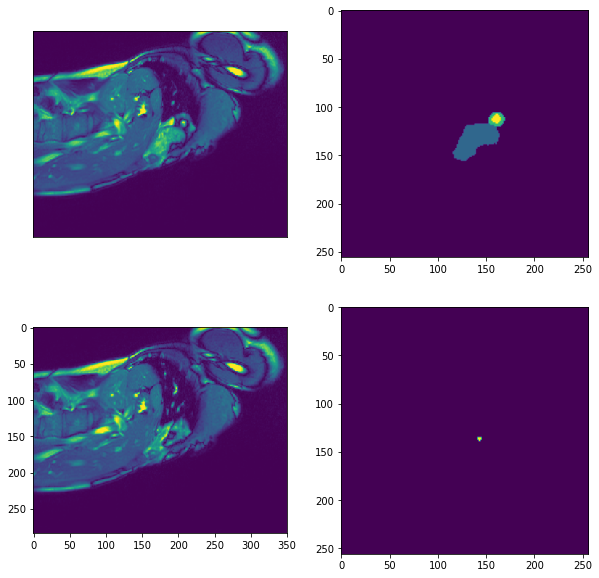

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient085/patient085_slice15_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient085/patient085_slice15_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient085/patient085_slice15_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient085/patient085_slice15_frame09_label.nii.npy',
 'Not max3')
'Not max3'


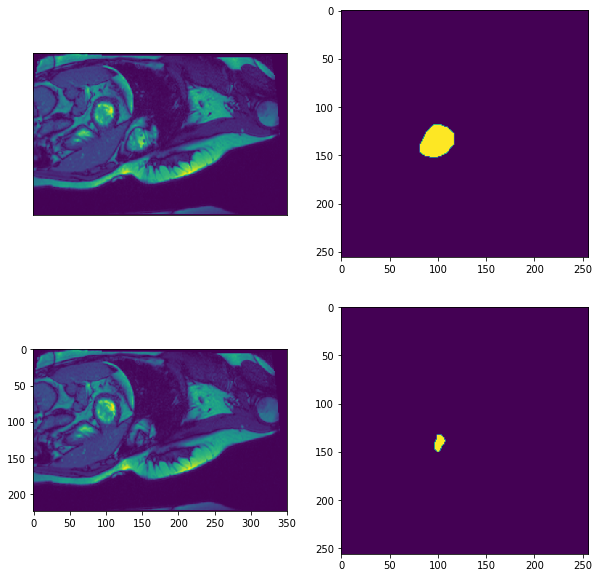

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient086/patient086_slice7_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient086/patient086_slice7_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient086/patient086_slice7_frame8.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient086/patient086_slice7_frame08_label.nii.npy',
 'Not max3')
'Not max3'


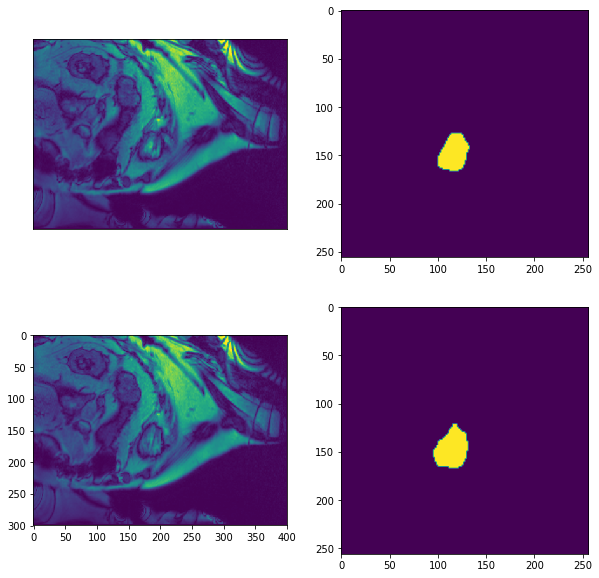

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient088/patient088_slice16_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient088/patient088_slice16_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient088/patient088_slice16_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient088/patient088_slice16_frame12_label.nii.npy',
 'All zeros')
'All zeros'


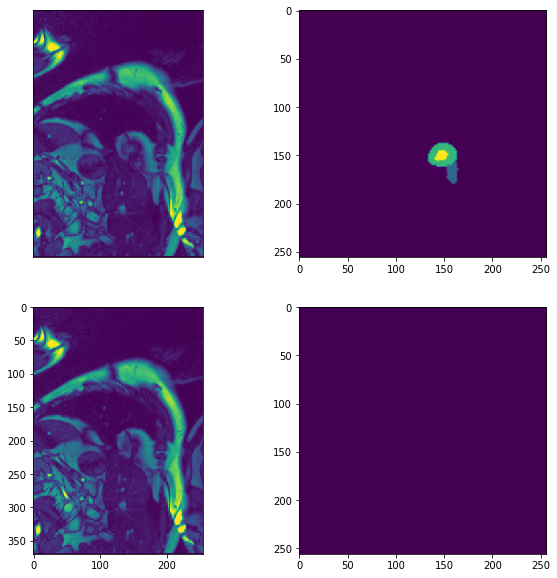

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient088/patient088_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient088/patient088_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient088/patient088_slice1_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient088/patient088_slice1_frame12_label.nii.npy',
 'All zeros')
'All zeros'


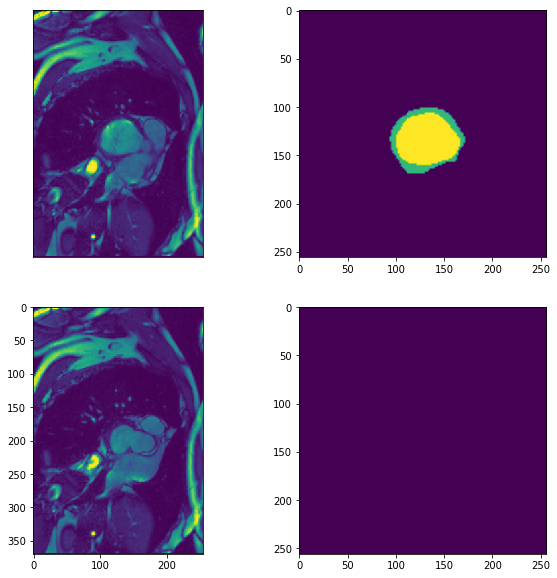

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient090/patient090_slice7_frame4.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient090/patient090_slice7_frame4_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient090/patient090_slice7_frame11.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient090/patient090_slice7_frame11_label.nii.npy',
 'Not max3')
'Not max3'


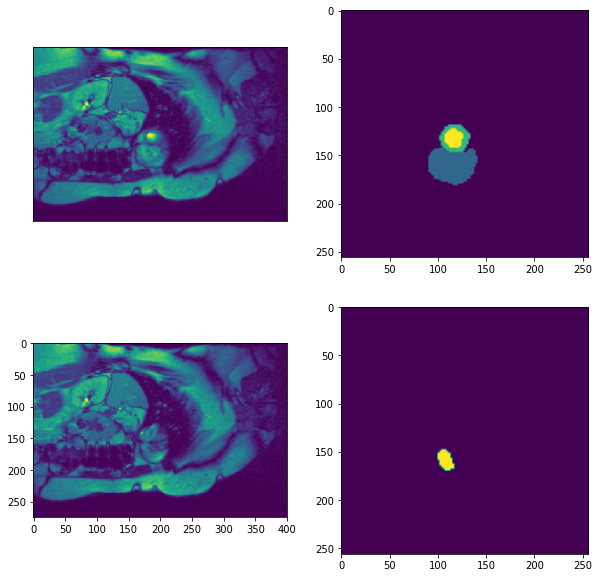

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient091/patient091_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient091/patient091_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient091/patient091_slice1_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient091/patient091_slice1_frame09_label.nii.npy',
 'All zeros')
'All zeros'


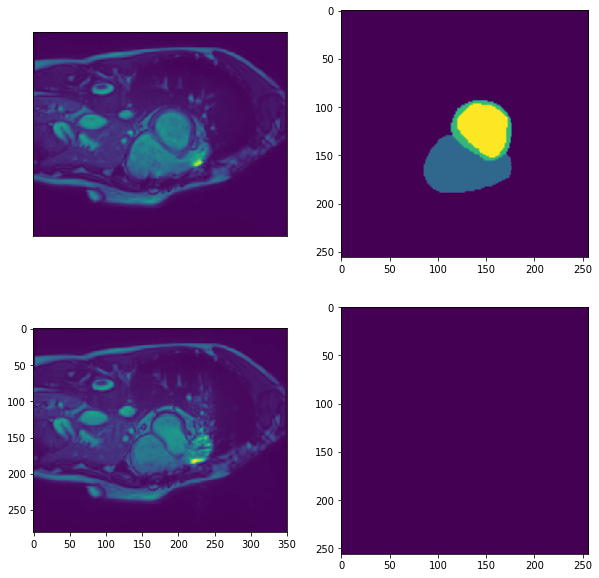

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient091/patient091_slice8_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient091/patient091_slice8_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient091/patient091_slice8_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient091/patient091_slice8_frame09_label.nii.npy',
 'Not max3')
'Not max3'


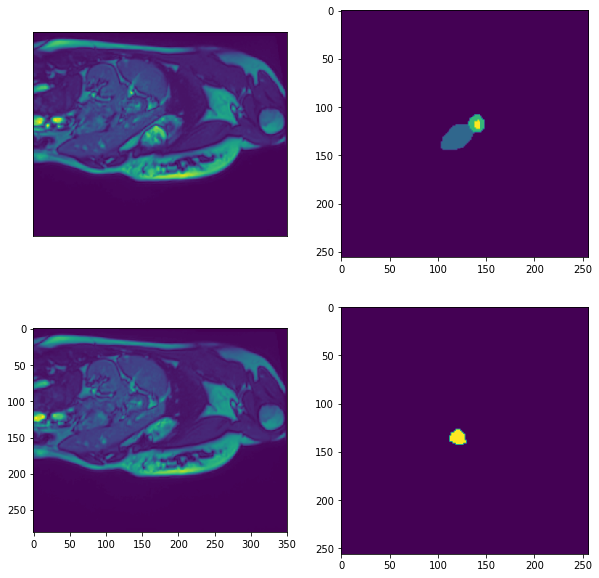

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient092/patient092_slice14_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient092/patient092_slice14_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient092/patient092_slice14_frame6.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient092/patient092_slice14_frame06_label.nii.npy',
 'Not max3')
'Not max3'


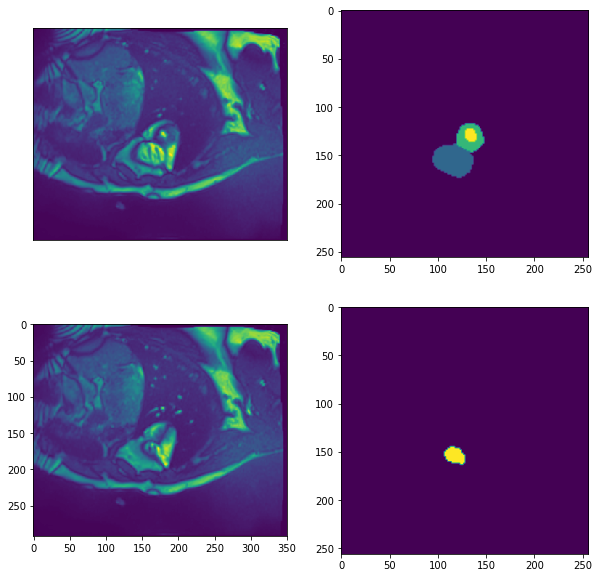

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient092/patient092_slice15_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient092/patient092_slice15_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient092/patient092_slice15_frame6.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient092/patient092_slice15_frame06_label.nii.npy',
 'All zeros')
'All zeros'


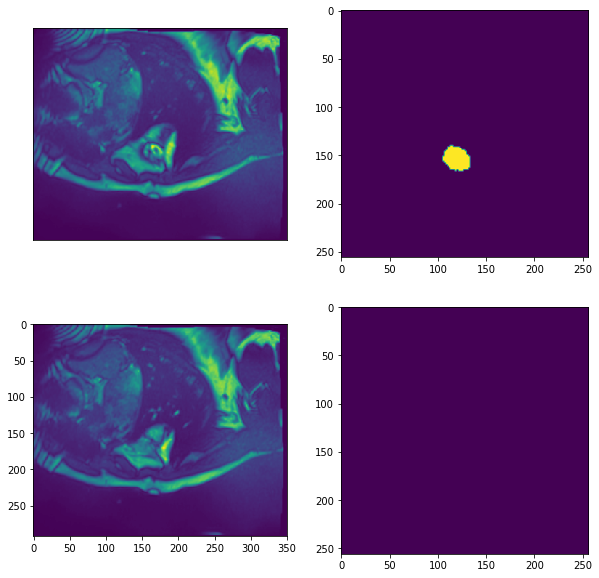

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient092/patient092_slice15_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient092/patient092_slice15_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient092/patient092_slice15_frame6.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient092/patient092_slice15_frame06_label.nii.npy',
 'Not max3')
'Not max3'


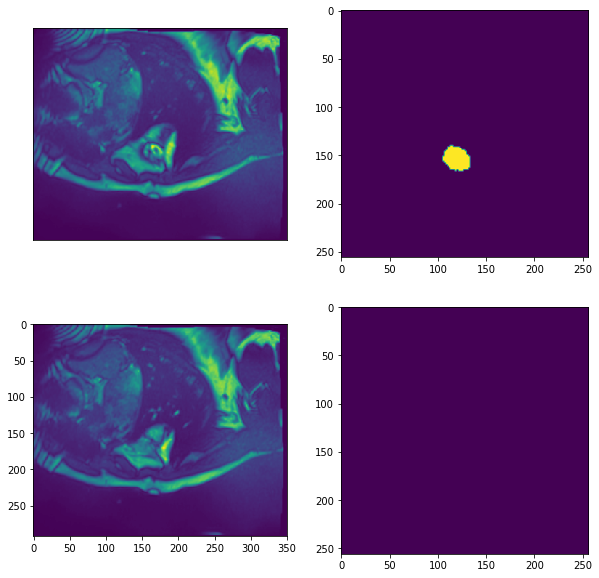

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient093/patient093_slice10_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient093/patient093_slice10_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient093/patient093_slice10_frame14.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient093/patient093_slice10_frame14_label.nii.npy',
 'Not max3')
'Not max3'


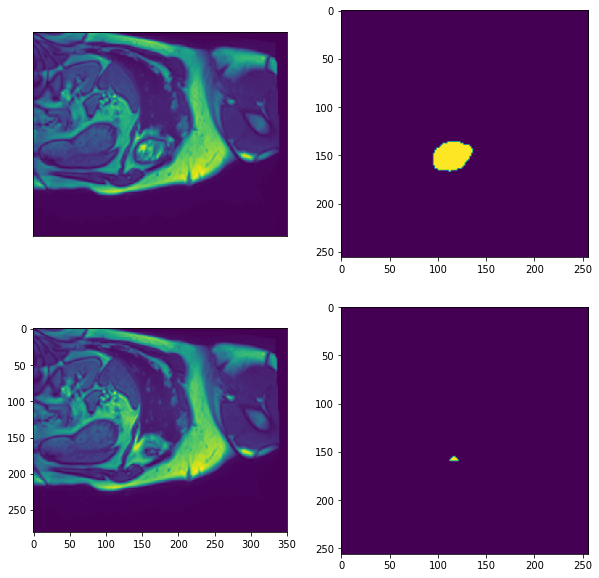

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient093/patient093_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient093/patient093_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient093/patient093_slice1_frame14.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient093/patient093_slice1_frame14_label.nii.npy',
 'All zeros')
'All zeros'


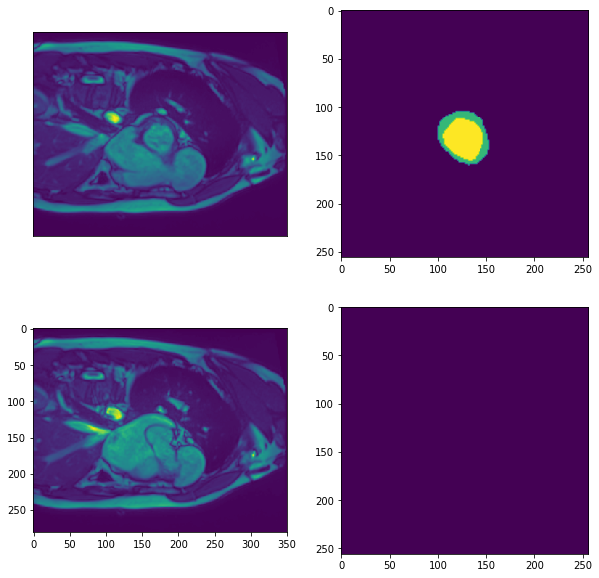

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient095/patient095_slice14_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient095/patient095_slice14_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient095/patient095_slice14_frame12.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient095/patient095_slice14_frame12_label.nii.npy',
 'All zeros')
'All zeros'


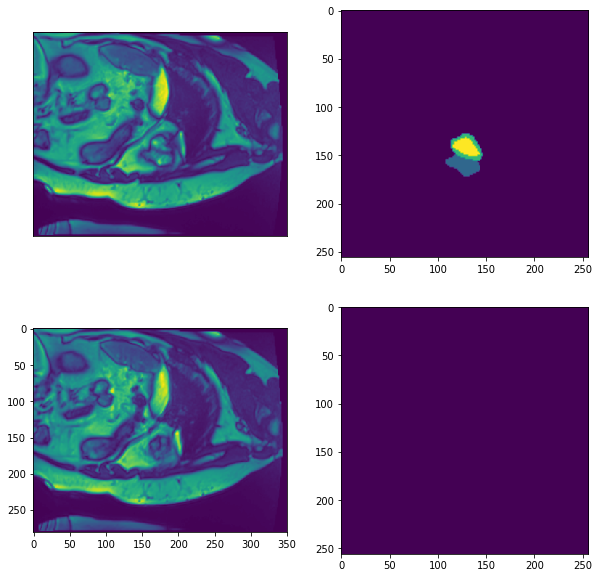

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient096/patient096_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient096/patient096_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient096/patient096_slice1_frame8.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient096/patient096_slice1_frame08_label.nii.npy',
 'All zeros')
'All zeros'


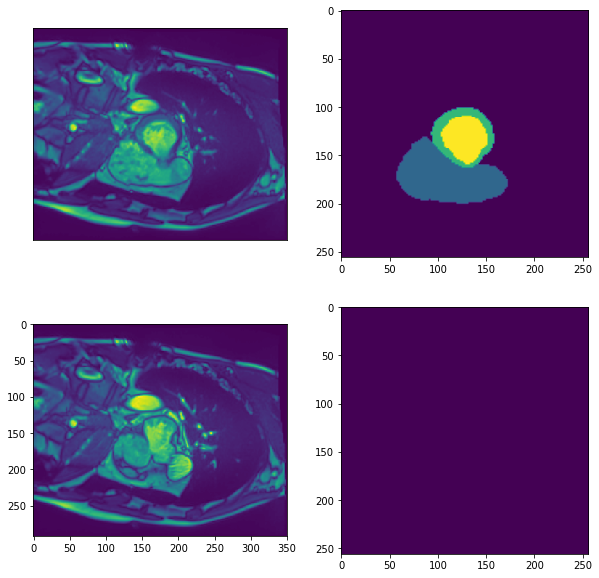

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient099/patient099_slice16_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient099/patient099_slice16_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient099/patient099_slice16_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient099/patient099_slice16_frame09_label.nii.npy',
 'Not max3')
'Not max3'


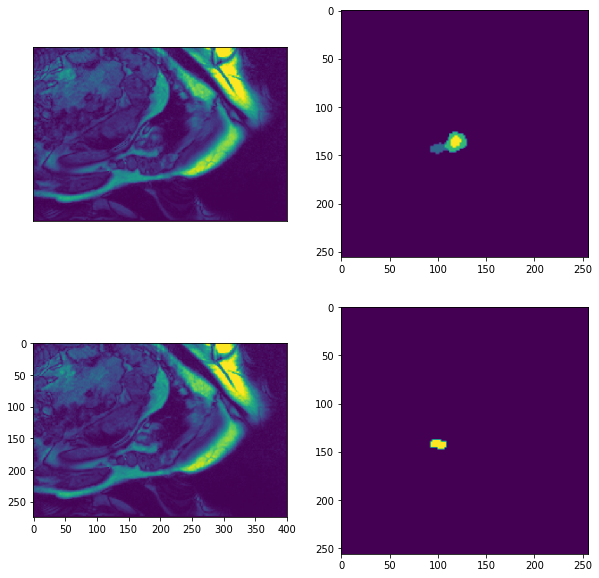

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient099/patient099_slice1_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient099/patient099_slice1_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient099/patient099_slice1_frame9.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient099/patient099_slice1_frame09_label.nii.npy',
 'All zeros')
'All zeros'


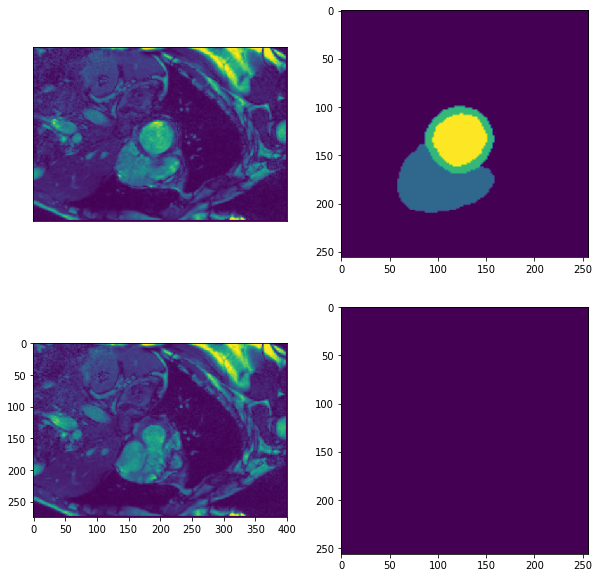

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient100/patient100_slice8_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient100/patient100_slice8_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient100/patient100_slice8_frame13.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient100/patient100_slice8_frame13_label.nii.npy',
 'All zeros')
'All zeros'


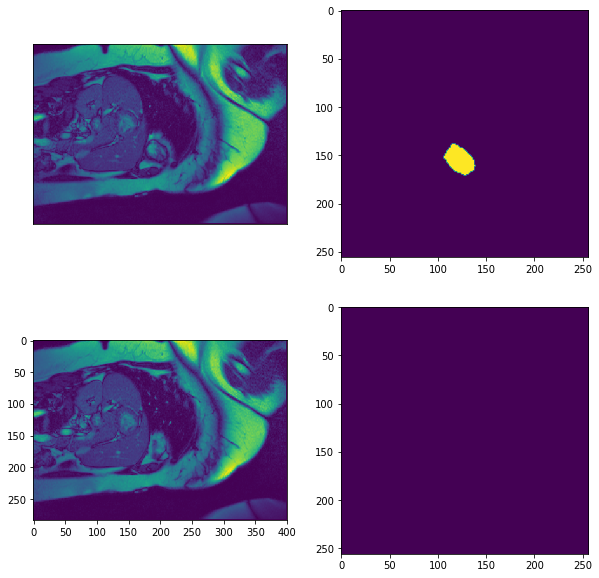

('/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient100/patient100_slice8_frame1.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient100/patient100_slice8_frame1_label.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient100/patient100_slice8_frame13.nii.npy',
 '/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient100/patient100_slice8_frame13_label.nii.npy',
 'Not max3')
'Not max3'


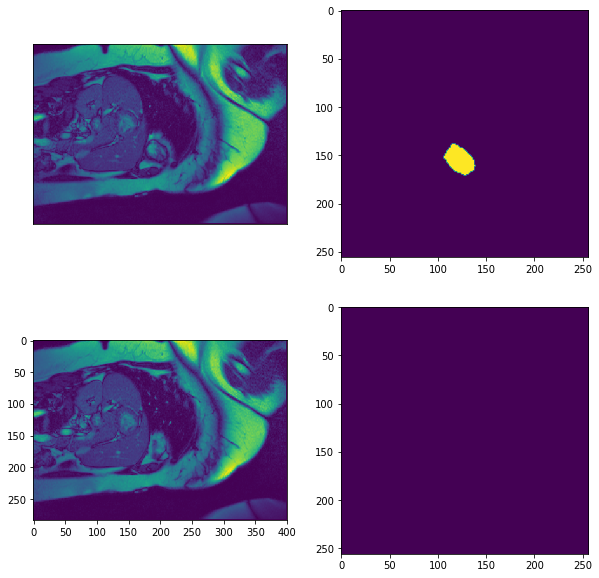

In [205]:
l = 0

for i in range(len(plotall)):
    pprint.pprint(plotall[i])    
    a, b, c, d,e = plotall[i]
    f, axs = plt.subplots(1,3,figsize=(10,10))
    plt.subplot(221),plt.imshow(np.load(a)) #.reshape(x, y))
    #plt.title('test image {0} size:{1}'.format(image_array[i],ones))
    plt.xticks([]), plt.yticks([])
    
    plt.subplot(222),plt.imshow(np.load(b)) #predictions[i].reshape(x, y))
    #plt.title('prediction'), plt.xticks([]), plt.yticks([])
    plt.subplot(223),plt.imshow(np.load(c)) #pred_round[i].reshape(x, y))
    plt.subplot(224),plt.imshow(np.load(d)) #im[i].reshape(x, y))
    #plt.title('prediction_clean'), plt.xticks([]), plt.yticks([])
    pprint.pprint(e)
    plt.show()
    #print(l)
    l+=1

In [1]:
test_path='/masvol/output/acdc/norm/opt/output/acdc/norm/1/3/patient067'
for i in sorted(glob.glob(test_path+'/*frame1_*')):
    print(i)
    i13=i.replace('frame1_','frame10_')
    print(i13)
    f, axs = plt.subplots(1,3,figsize=(10,10))
    #plt.subplot(121),plt.imshow(np.load(i))
    #plt.subplot(122),plt.imshow(np.load(i13))
    #plt.show()    

NameError: name 'glob' is not defined